In [199]:
import pandas as pd
import time

In [200]:
start=time.perf_counter()

In [201]:
from DatabaseCreator import DatabaseCreator
import CJDH_local_settings

#Run Database Creator
if __name__ == "__main__":
    db_creator = DatabaseCreator(db_settings=CJDH_local_settings.local_settings['FPL_Points_Predictor'])
    fpl_engine = db_creator.get_engine_for("fpl_data_analysis")

In [202]:
from FPLPredictor import FPLPredictor

In [203]:
#add this info to a settings dict?
stats_current_gameweek = 13
picks_current_gameweek = 13
current_season = 20252026

In [204]:
# Load df from sql
df = db_creator.run_sql("""SELECT *
                        FROM playergw_transformed
                          """)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146954 entries, 0 to 146953
Columns: 293 entries, player_name_id to saves_elo_adj_per90_running_avg_prev_10
dtypes: float64(288), object(5)
memory usage: 328.5+ MB


In [205]:
df[(df['season']==current_season)
   &(df['team_name']=='Arsenal')
#    &(df['event']==9)
   &(df['player_name_id']=='Bukayo Saka')
   ][['player_name_id','event','total_points','opp_team_name']].sort_values(by='event')

,player_name_id,event,total_points,opp_team_name
131881,Bukayo Saka,1.0,3.0,Man Utd
131882,Bukayo Saka,2.0,6.0,Leeds
131794,Bukayo Saka,3.0,0.0,Liverpool
131782,Bukayo Saka,4.0,0.0,Nott'm Forest
131785,Bukayo Saka,5.0,1.0,Man City
131883,Bukayo Saka,6.0,2.0,Newcastle
131884,Bukayo Saka,7.0,8.0,West Ham
131885,Bukayo Saka,8.0,7.0,Fulham
131886,Bukayo Saka,9.0,3.0,Crystal Palace
131887,Bukayo Saka,10.0,3.0,Burnley


In [206]:
cbi_defcon_cols = ['cbi_alltime_avg',
 'cbi_per90_alltime_avg',
 'cbi_running_avg_prev_3',
 'cbi_per90_running_avg_prev_3',
 'cbi_elo_adj_running_avg_prev_3',
 'cbi_elo_adj_per90_running_avg_prev_3',
 'cbi_running_avg_prev_5',
 'cbi_per90_running_avg_prev_5',
 'cbi_elo_adj_running_avg_prev_5',
 'cbi_elo_adj_per90_running_avg_prev_5',
 'cbi_running_avg_prev_10',
 'cbi_per90_running_avg_prev_10',
 'cbi_elo_adj_running_avg_prev_10',
 'cbi_elo_adj_per90_running_avg_prev_10',
 'defensive_contribution_alltime_avg',
 'defensive_contribution_per90_alltime_avg',
 'defensive_contribution_running_avg_prev_3',
 'defensive_contribution_per90_running_avg_prev_3',
 'defensive_contribution_elo_adj_running_avg_prev_3',
 'defensive_contribution_elo_adj_per90_running_avg_prev_3',
 'defensive_contribution_running_avg_prev_5',
 'defensive_contribution_per90_running_avg_prev_5',
 'defensive_contribution_elo_adj_running_avg_prev_5',
 'defensive_contribution_elo_adj_per90_running_avg_prev_5',
 'defensive_contribution_running_avg_prev_10',
 'defensive_contribution_per90_running_avg_prev_10',
 'defensive_contribution_elo_adj_running_avg_prev_10',
 'defensive_contribution_elo_adj_per90_running_avg_prev_10',
 'saves_alltime_avg',
 'saves_per90_alltime_avg',
 'saves_running_avg_prev_3',
 'saves_per90_running_avg_prev_3',
 'saves_elo_adj_running_avg_prev_3',
 'saves_elo_adj_per90_running_avg_prev_3',
 'saves_running_avg_prev_5',
 'saves_per90_running_avg_prev_5',
 'saves_elo_adj_running_avg_prev_5',
 'saves_elo_adj_per90_running_avg_prev_5',
 'saves_running_avg_prev_10',
 'saves_per90_running_avg_prev_10',
 'saves_elo_adj_running_avg_prev_10',
 'saves_elo_adj_per90_running_avg_prev_10',
 'recoveries_alltime_avg',
 'recoveries_per90_alltime_avg',
 'recoveries_running_avg_prev_3',
 'recoveries_per90_running_avg_prev_3',
 'recoveries_elo_adj_running_avg_prev_3',
 'recoveries_elo_adj_per90_running_avg_prev_3',
 'recoveries_running_avg_prev_5',
 'recoveries_per90_running_avg_prev_5',
 'recoveries_elo_adj_running_avg_prev_5',
 'recoveries_elo_adj_per90_running_avg_prev_5',
 'recoveries_running_avg_prev_10',
 'recoveries_per90_running_avg_prev_10',
 'recoveries_elo_adj_running_avg_prev_10',
 'recoveries_elo_adj_per90_running_avg_prev_10',
 'tackles_alltime_avg',
 'tackles_per90_alltime_avg',
 'tackles_running_avg_prev_3',
 'tackles_per90_running_avg_prev_3',
 'tackles_elo_adj_running_avg_prev_3',
 'tackles_elo_adj_per90_running_avg_prev_3',
 'tackles_running_avg_prev_5',
 'tackles_per90_running_avg_prev_5',
 'tackles_elo_adj_running_avg_prev_5',
 'tackles_elo_adj_per90_running_avg_prev_5',
 'tackles_running_avg_prev_10',
 'tackles_per90_running_avg_prev_10',
 'tackles_elo_adj_running_avg_prev_10',
 'tackles_elo_adj_per90_running_avg_prev_10']

In [207]:
# #restricts to player_name_id who have >0 minutes in that season
# #model struggles to predict higher values, so maybe cut-off points at 10, or try log(points) as a depvar
# for each indepvar: filter outliers & standardize

Cleaned df size: 7472/13826

Training Set Performance:
R² Score: 0.8029
RMSE: 16.2672
MAE: 11.7843

Test Set Performance:
R² Score: 0.5198
RMSE: 25.5095
MAE: 17.9825

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.567379
                          minutes_elo_adj_running_avg_prev_3    0.067495
                            opp_team_elo_running_avg_prev_10    0.007757
                             opp_team_elo_running_avg_prev_3    0.007213
                                 minutes_running_avg_prev_10    0.006408
                                     bps_running_avg_prev_10    0.006194
                    minutes_elo_adj_per90_running_avg_prev_5    0.005790
                             opp_team_elo_running_avg_prev_5    0.005714
                                                opp_team_elo    0.005687
                    goals_scored_elo_adj_running_avg_prev_10    0.005459
          

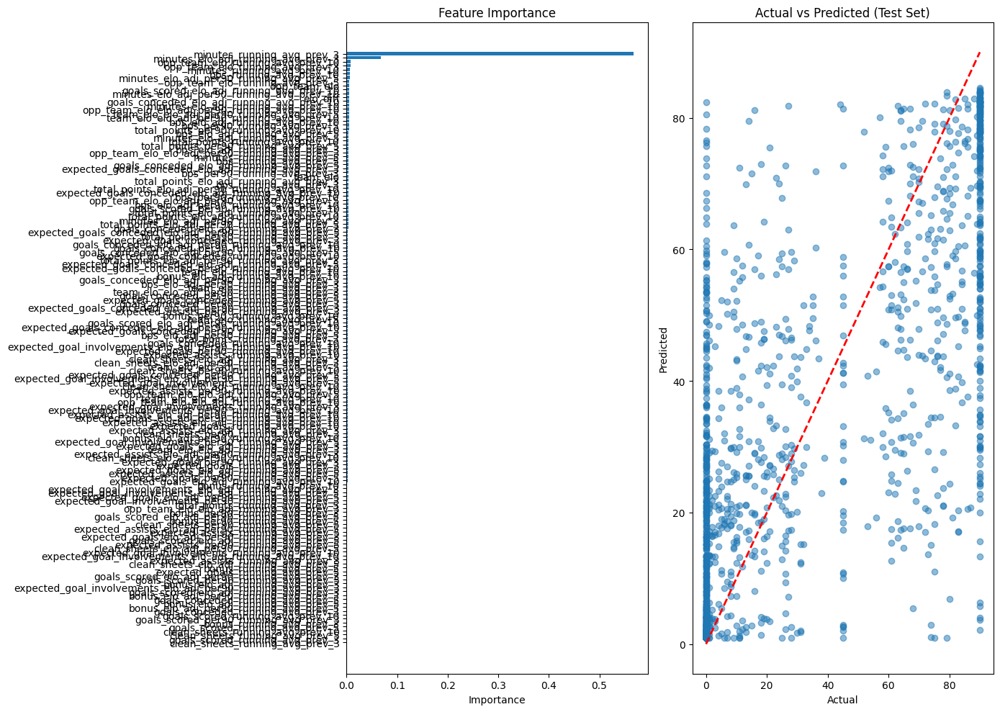

Cleaned df size: 28901/49935

Training Set Performance:
R² Score: 0.6853
RMSE: 21.5368
MAE: 15.7680

Test Set Performance:
R² Score: 0.5346
RMSE: 26.1559
MAE: 18.8294

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.733303
                          minutes_elo_adj_running_avg_prev_3    0.018397
                                 minutes_running_avg_prev_10    0.009225
                                  minutes_running_avg_prev_5    0.007843
                                     bps_running_avg_prev_10    0.007200
                          minutes_elo_adj_running_avg_prev_5    0.005178
                            opp_team_elo_running_avg_prev_10    0.004801
                                                opp_team_elo    0.004569
                         minutes_elo_adj_running_avg_prev_10    0.004283
                                                    elo_diff    0.004268
         

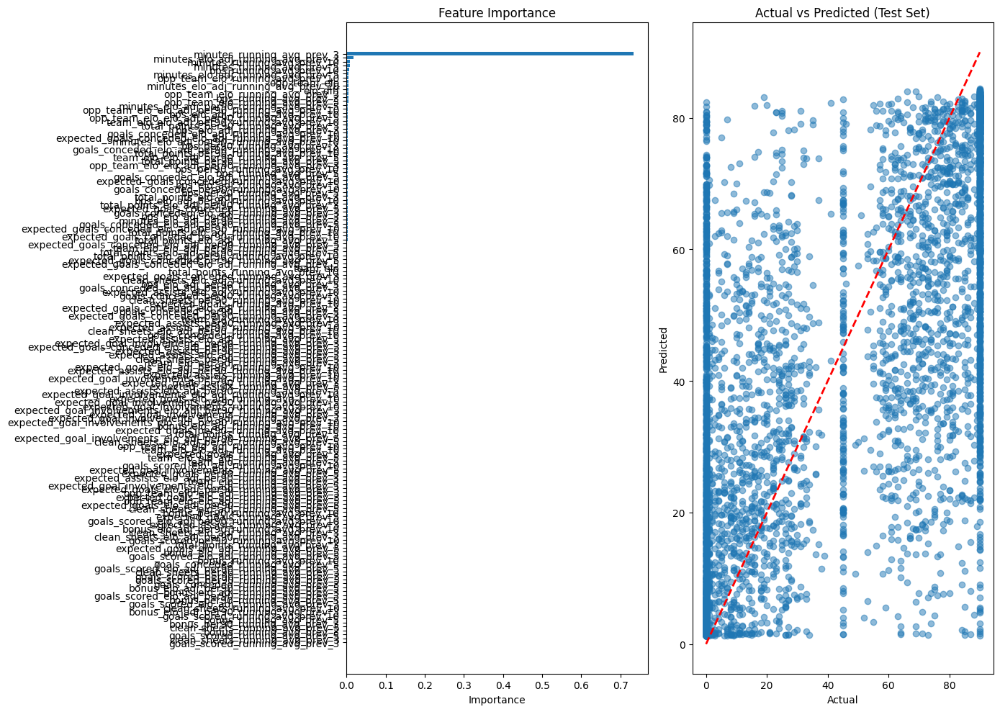

Cleaned df size: 21902/39111

Training Set Performance:
R² Score: 0.6568
RMSE: 24.7252
MAE: 18.2232

Test Set Performance:
R² Score: 0.4875
RMSE: 30.2475
MAE: 22.3317

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.698948
                          minutes_elo_adj_running_avg_prev_3    0.016191
                                 minutes_running_avg_prev_10    0.009606
                            opp_team_elo_running_avg_prev_10    0.007308
                                                opp_team_elo    0.006678
                             opp_team_elo_running_avg_prev_5    0.006664
                             opp_team_elo_running_avg_prev_3    0.006427
                                                    elo_diff    0.005450
                                  minutes_running_avg_prev_5    0.004638
                   goals_conceded_elo_adj_running_avg_prev_5    0.004521
         

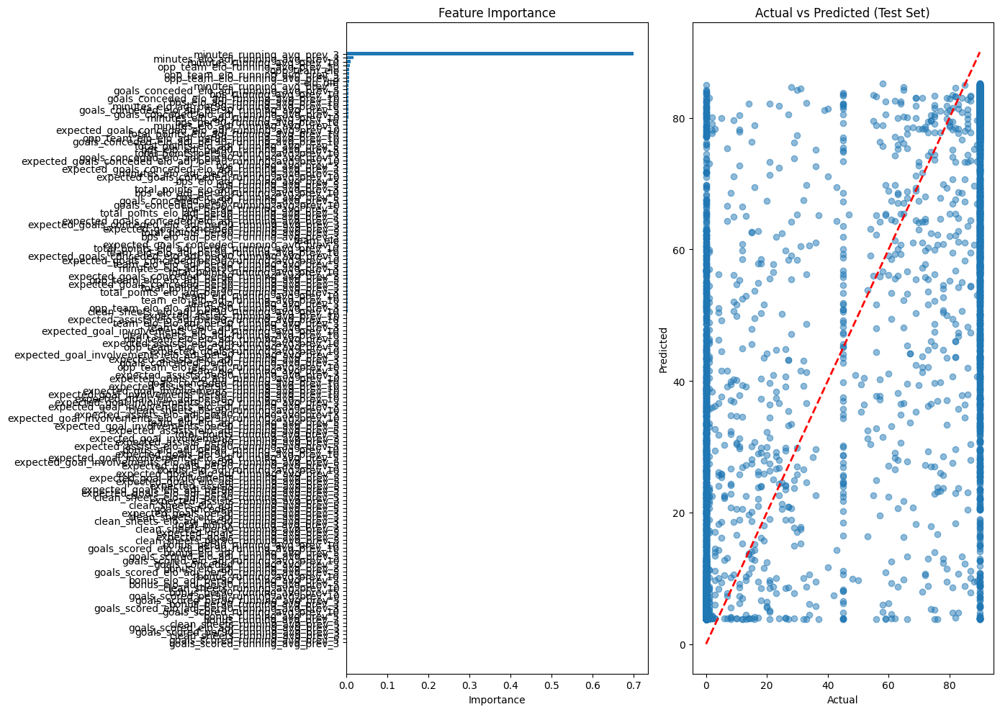

Cleaned df size: 4674/8287

Training Set Performance:
R² Score: 0.8398
RMSE: 17.9064
MAE: 10.0144

Test Set Performance:
R² Score: 0.6913
RMSE: 24.8216
MAE: 14.4499

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.235632
                             total_points_running_avg_prev_3    0.205170
                     total_points_elo_adj_running_avg_prev_3    0.153640
                       total_points_per90_running_avg_prev_3    0.111033
               total_points_elo_adj_per90_running_avg_prev_3    0.025430
                            opp_team_elo_running_avg_prev_10    0.010070
                             opp_team_elo_running_avg_prev_3    0.008878
                                                opp_team_elo    0.008143
                             opp_team_elo_running_avg_prev_5    0.007439
                    minutes_elo_adj_per90_running_avg_prev_3    0.007048
           

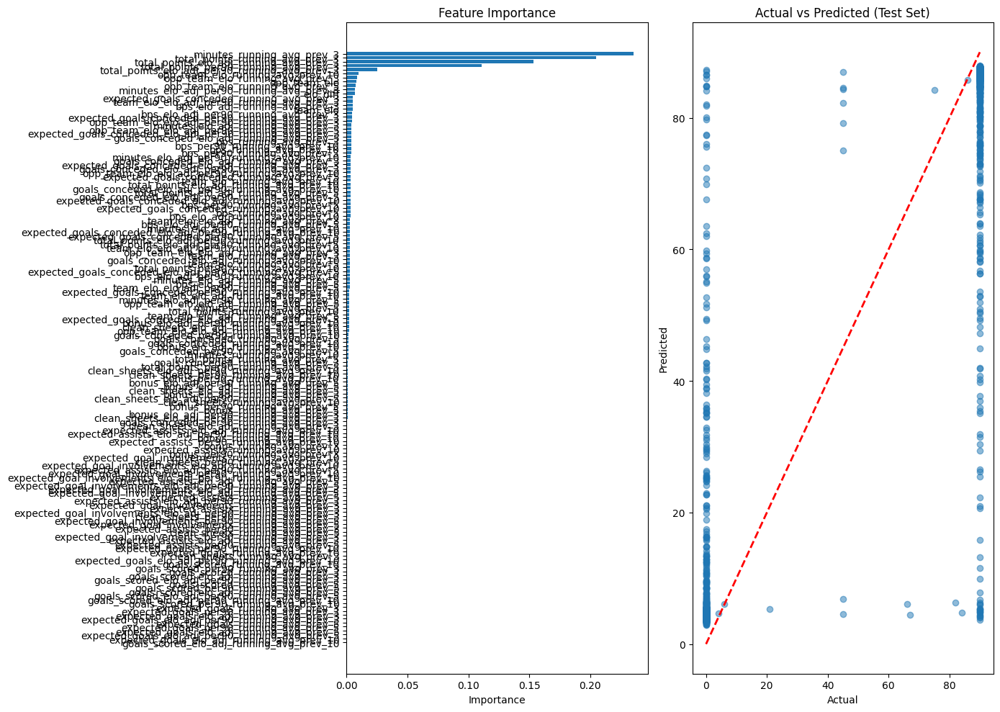

In [208]:
filtered = (df['player_season_minutes_total']>0)#&(df['total_points']<15)#&(df['minutes']>45)

if __name__ == "__main__":
    
    FWD_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols
        )
    FWD_mins_predictor.fit()
    FWD_mins_predictor.plot_results()

    MID_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_mins_predictor.fit()
    MID_mins_predictor.plot_results()

    DEF_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_mins_predictor.fit()
    DEF_mins_predictor.plot_results()

    GK_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_mins_predictor.fit()
    GK_mins_predictor.plot_results()

target=expected_goals_per90, FWD_xG_predictor
Cleaned df size: 2410/4130

Training Set Performance:
R² Score: 0.6395
RMSE: 0.2672
MAE: 0.2043

Test Set Performance:
R² Score: 0.0736
RMSE: 0.4587
MAE: 0.3254

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.073753
expected_goal_involvements_elo_adj_per90_running_avg_prev_10    0.035505
                 expected_goals_conceded_running_avg_prev_10    0.027852
                                                opp_team_elo    0.024001
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.019873
        expected_goal_involvements_per90_running_avg_prev_10    0.019196
         expected_goal_involvements_per90_running_avg_prev_3    0.014998
              goals_scored_elo_adj_per90_running_avg_prev_10    0.014128
                  expected_goals_conceded_running_avg_prev_5    0.013458
   expected_goals_conceded_elo_adj_per90_r

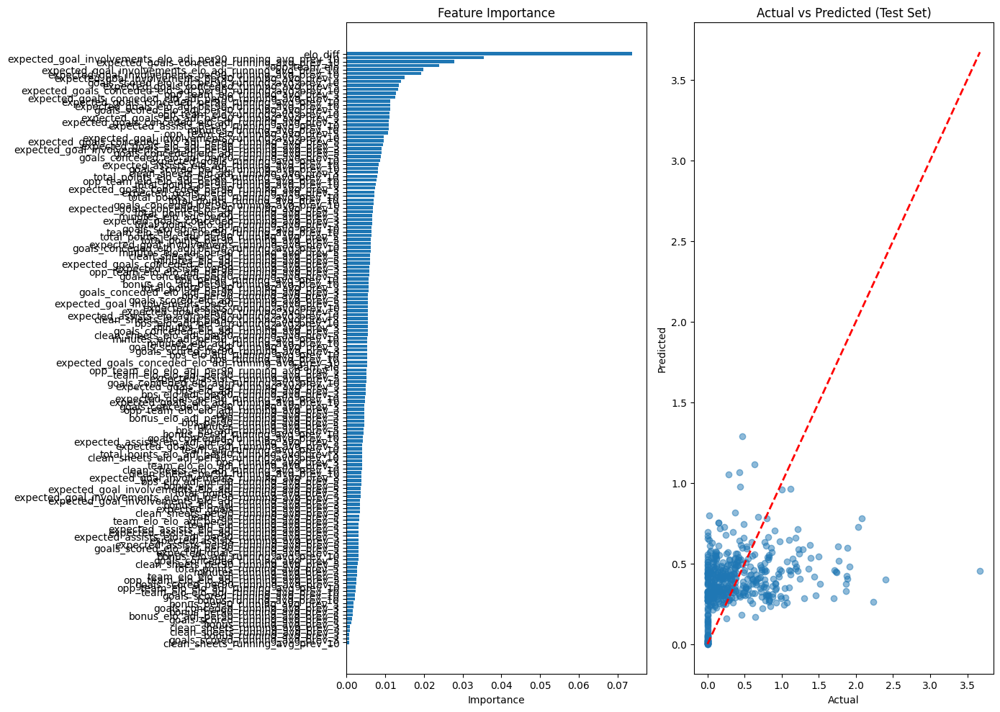

target=expected_goals_per90, MID_xG_predictor
Cleaned df size: 10795/17097

Training Set Performance:
R² Score: 0.5300
RMSE: 0.1755
MAE: 0.1154

Test Set Performance:
R² Score: 0.1273
RMSE: 0.2285
MAE: 0.1413

Feature Importance:
                                                     feature  importance
                    expected_goals_per90_running_avg_prev_10    0.102237
                          expected_goals_running_avg_prev_10    0.070698
                  expected_goals_elo_adj_running_avg_prev_10    0.051406
                                                opp_team_elo    0.038713
            expected_goals_elo_adj_per90_running_avg_prev_10    0.024882
                             opp_team_elo_running_avg_prev_5    0.022050
             expected_goals_elo_adj_per90_running_avg_prev_5    0.019106
                                                    elo_diff    0.017832
                             opp_team_elo_running_avg_prev_3    0.017170
              expected_goal_involvements

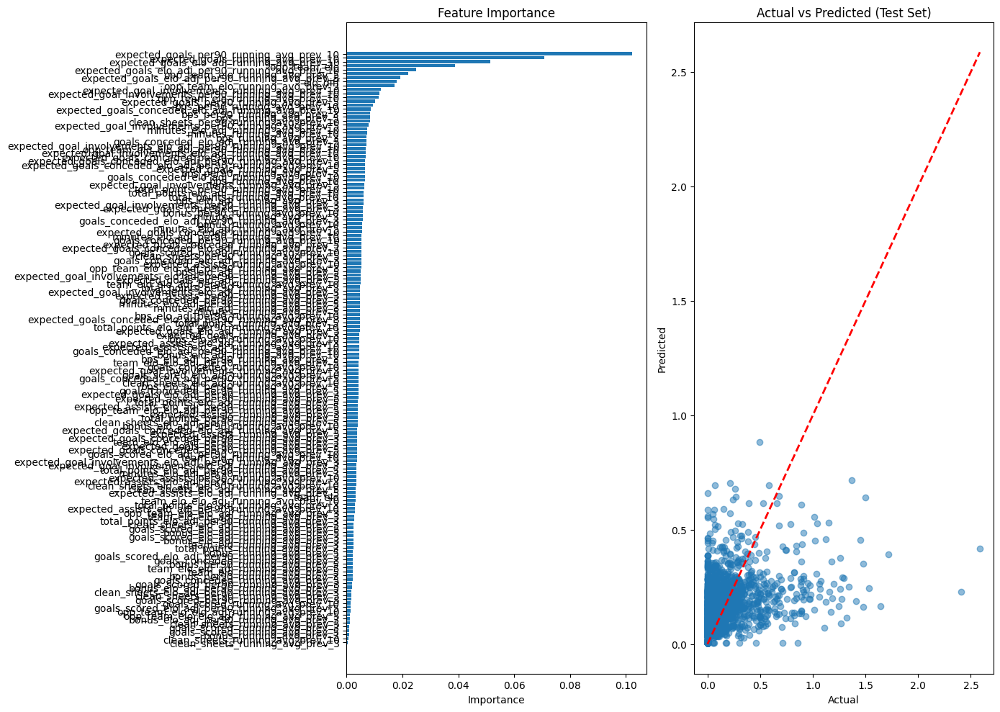

target=expected_goals_per90, DEF_xG_predictor
Cleaned df size: 9299/15098

Training Set Performance:
R² Score: 0.3559
RMSE: 0.0916
MAE: 0.0531

Test Set Performance:
R² Score: 0.0200
RMSE: 0.1242
MAE: 0.0655

Feature Importance:
                                                     feature  importance
            expected_goals_elo_adj_per90_running_avg_prev_10    0.033606
                             opp_team_elo_running_avg_prev_5    0.028305
                                                opp_team_elo    0.025902
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.024597
                  expected_goals_elo_adj_running_avg_prev_10    0.023861
                                                    elo_diff    0.020940
                  goals_conceded_elo_adj_running_avg_prev_10    0.018951
              total_points_elo_adj_per90_running_avg_prev_10    0.018716
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.018031
                          expected_goals_

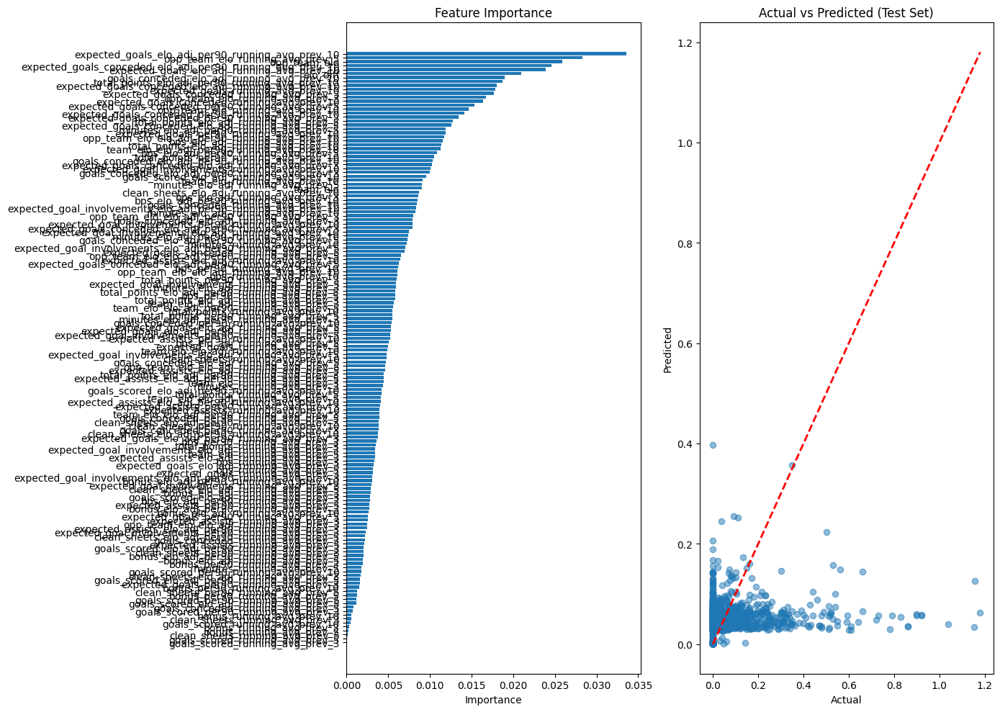

In [209]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_goals_per90, FWD_xG_predictor")
    FWD_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xG_predictor.fit()
    FWD_xG_predictor.plot_results()

    print("target=expected_goals_per90, MID_xG_predictor")
    MID_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xG_predictor.fit()
    MID_xG_predictor.plot_results()
    
    print("target=expected_goals_per90, DEF_xG_predictor")
    DEF_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xG_predictor.fit()
    DEF_xG_predictor.plot_results()

target=expected_assists_per90, FWD_xA_predictor
Cleaned df size: 2410/4130

Training Set Performance:
R² Score: 0.5444
RMSE: 0.0824
MAE: 0.0536

Test Set Performance:
R² Score: 0.0629
RMSE: 0.1278
MAE: 0.0758

Feature Importance:
                                                     feature  importance
                 expected_assists_elo_adj_running_avg_prev_3    0.054562
                                                opp_team_elo    0.047265
                expected_assists_elo_adj_running_avg_prev_10    0.041241
          expected_assists_elo_adj_per90_running_avg_prev_10    0.035149
           expected_assists_elo_adj_per90_running_avg_prev_5    0.026303
                   expected_assists_per90_running_avg_prev_5    0.018226
                 expected_assists_elo_adj_running_avg_prev_5    0.017195
                  expected_assists_per90_running_avg_prev_10    0.015568
                             opp_team_elo_running_avg_prev_3    0.015304
                            opp_team_elo

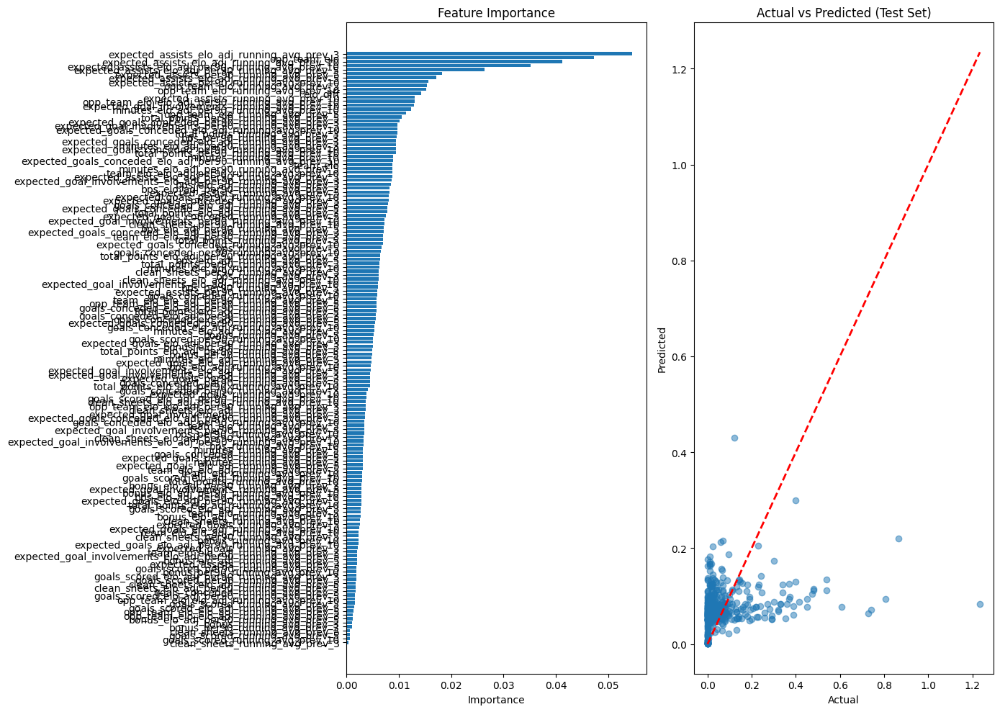

target=expected_assists_per90, MID_xA_predictor
Cleaned df size: 10795/17097

Training Set Performance:
R² Score: 0.4782
RMSE: 0.1178
MAE: 0.0800

Test Set Performance:
R² Score: 0.1601
RMSE: 0.1484
MAE: 0.0976

Feature Importance:
                                                     feature  importance
          expected_assists_elo_adj_per90_running_avg_prev_10    0.099281
                expected_assists_elo_adj_running_avg_prev_10    0.076588
                                                    elo_diff    0.048793
                                                opp_team_elo    0.032445
                  expected_assists_per90_running_avg_prev_10    0.030013
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.022645
                        expected_assists_running_avg_prev_10    0.022547
expected_goal_involvements_elo_adj_per90_running_avg_prev_10    0.019581
           expected_assists_elo_adj_per90_running_avg_prev_5    0.014439
                             opp_team_

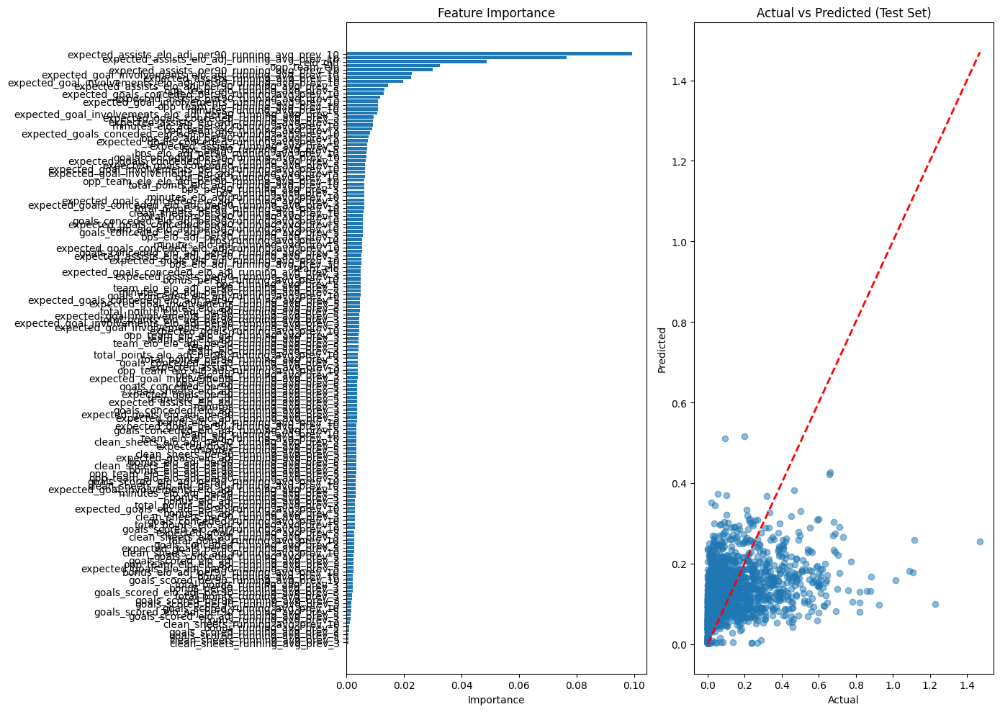

target=expected_assists_per90, DEF_xA_predictor
Cleaned df size: 9299/15098

Training Set Performance:
R² Score: 0.4690
RMSE: 0.0761
MAE: 0.0444

Test Set Performance:
R² Score: 0.0780
RMSE: 0.0970
MAE: 0.0538

Feature Importance:
                                                     feature  importance
                  expected_assists_per90_running_avg_prev_10    0.071313
          expected_assists_elo_adj_per90_running_avg_prev_10    0.068552
                        expected_assists_running_avg_prev_10    0.067716
                expected_assists_elo_adj_running_avg_prev_10    0.047653
                                                opp_team_elo    0.037776
                             opp_team_elo_running_avg_prev_3    0.026014
                                                    elo_diff    0.021840
                 expected_assists_elo_adj_running_avg_prev_5    0.021574
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.017334
                            opp_team_el

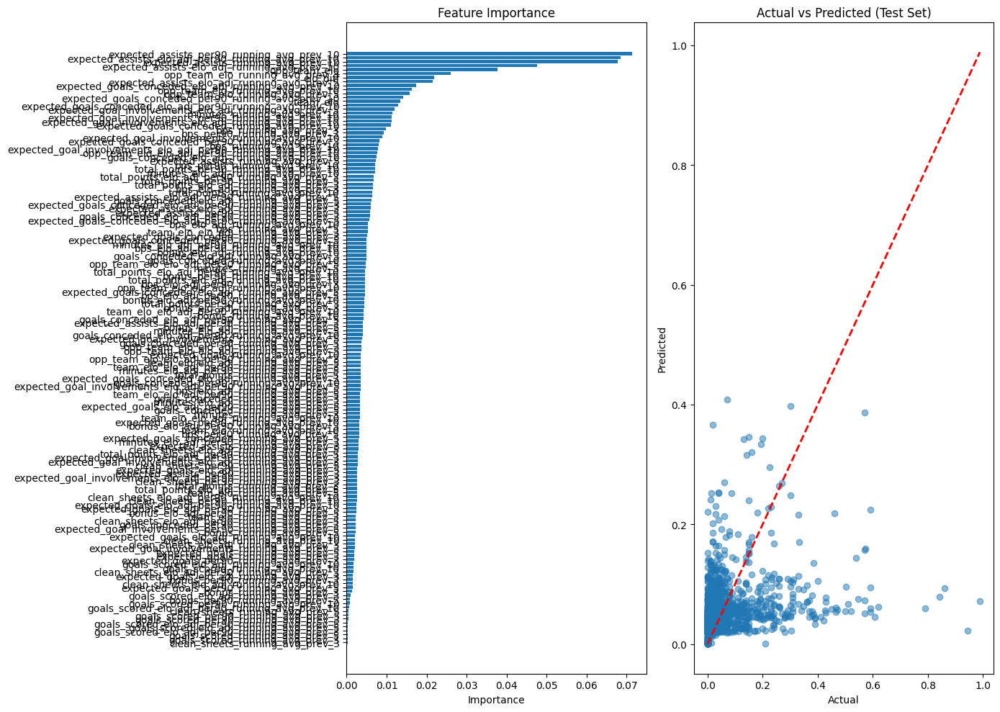

In [210]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_assists_per90, FWD_xA_predictor")
    FWD_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xA_predictor.fit()
    FWD_xA_predictor.plot_results()

    print("target=expected_assists_per90, MID_xA_predictor")
    MID_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xA_predictor.fit()
    MID_xA_predictor.plot_results()
    
    print("target=expected_assists_per90, DEF_xA_predictor")
    DEF_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xA_predictor.fit()
    DEF_xA_predictor.plot_results()

target=expected_goals_conceded_per90, FWD_xGC_predictor
Cleaned df size: 2410/4130

Training Set Performance:
R² Score: 0.7316
RMSE: 0.4854
MAE: 0.3791

Test Set Performance:
R² Score: 0.2926
RMSE: 0.7999
MAE: 0.5951

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.161330
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.121519
           expected_goals_conceded_per90_running_avg_prev_10    0.077218
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.045524
                 expected_goals_conceded_running_avg_prev_10    0.021509
                                                opp_team_elo    0.017661
                            opp_team_elo_running_avg_prev_10    0.016976
          expected_goals_conceded_elo_adj_running_avg_prev_5    0.016418
                             opp_team_elo_running_avg_prev_5    0.014580
                    minutes_elo_

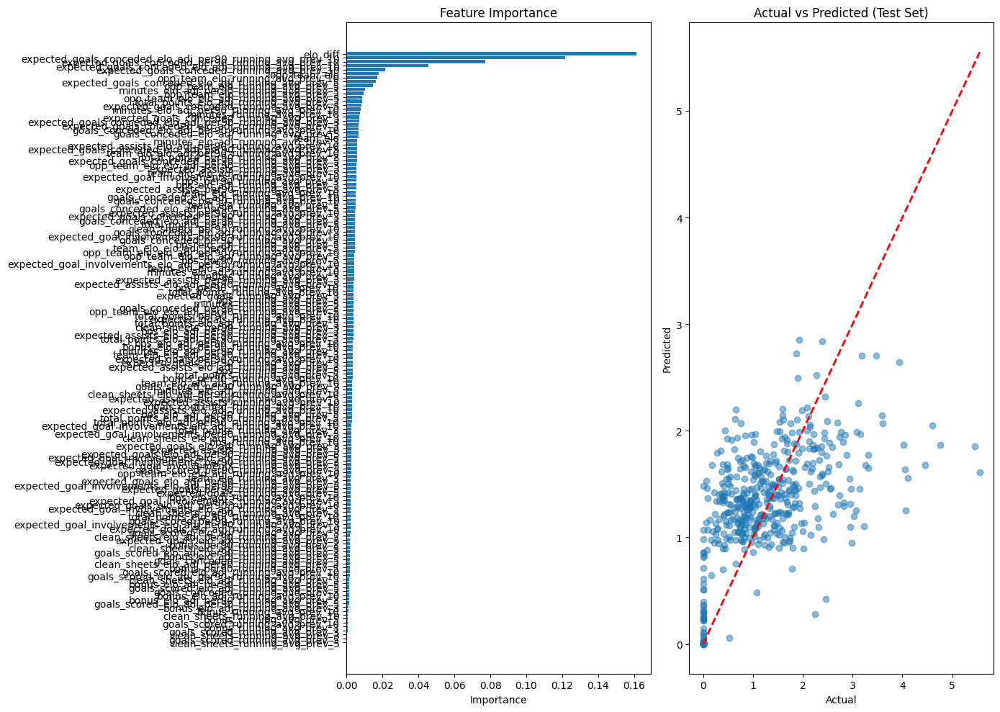

target=expected_goals_conceded_per90, MID_xGC_predictor
Cleaned df size: 10795/17097

Training Set Performance:
R² Score: 0.6270
RMSE: 0.5808
MAE: 0.4402

Test Set Performance:
R² Score: 0.4371
RMSE: 0.7085
MAE: 0.5344

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.247536
           expected_goals_conceded_per90_running_avg_prev_10    0.146492
                 expected_goals_conceded_running_avg_prev_10    0.059256
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.052685
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.047342
                                                opp_team_elo    0.022543
                             opp_team_elo_running_avg_prev_5    0.022306
          expected_goals_conceded_elo_adj_running_avg_prev_5    0.020590
                             opp_team_elo_running_avg_prev_3    0.017868
                            op

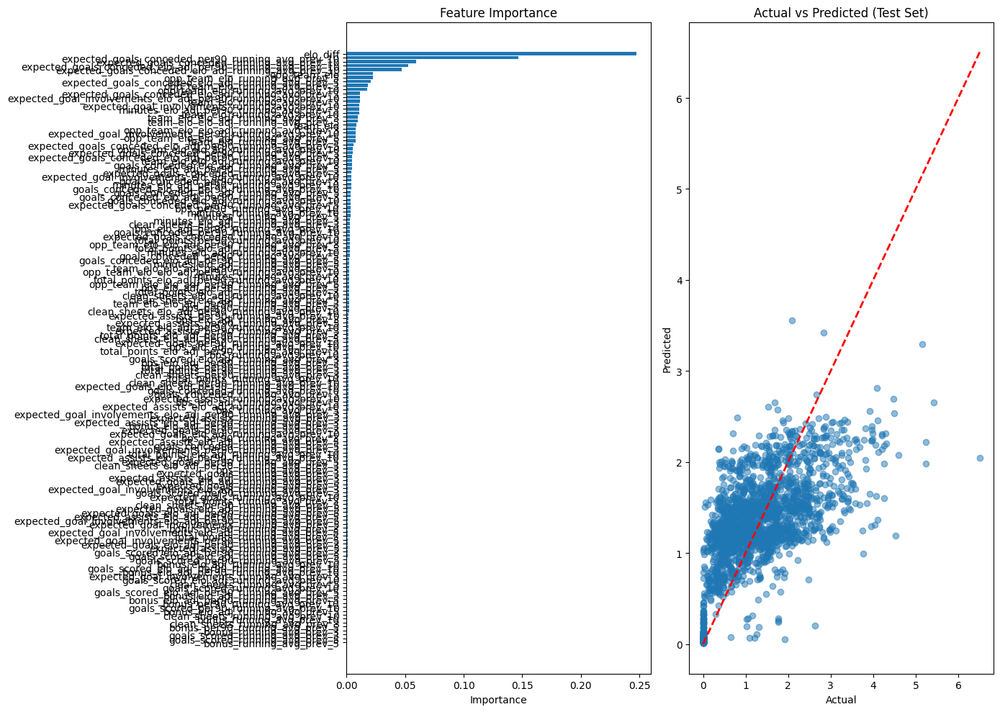

target=expected_goals_conceded_per90, DEF_xGC_predictor
Cleaned df size: 9299/15098

Training Set Performance:
R² Score: 0.6534
RMSE: 0.5519
MAE: 0.4187

Test Set Performance:
R² Score: 0.4187
RMSE: 0.7608
MAE: 0.5395

Feature Importance:
                                                     feature  importance
           expected_goals_conceded_per90_running_avg_prev_10    0.249894
                                                    elo_diff    0.235642
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.050611
                            opp_team_elo_running_avg_prev_10    0.022359
                             opp_team_elo_running_avg_prev_5    0.021842
                                                opp_team_elo    0.021764
                             opp_team_elo_running_avg_prev_3    0.017155
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.016143
                                team_elo_running_avg_prev_10    0.015814
                 expected_goals

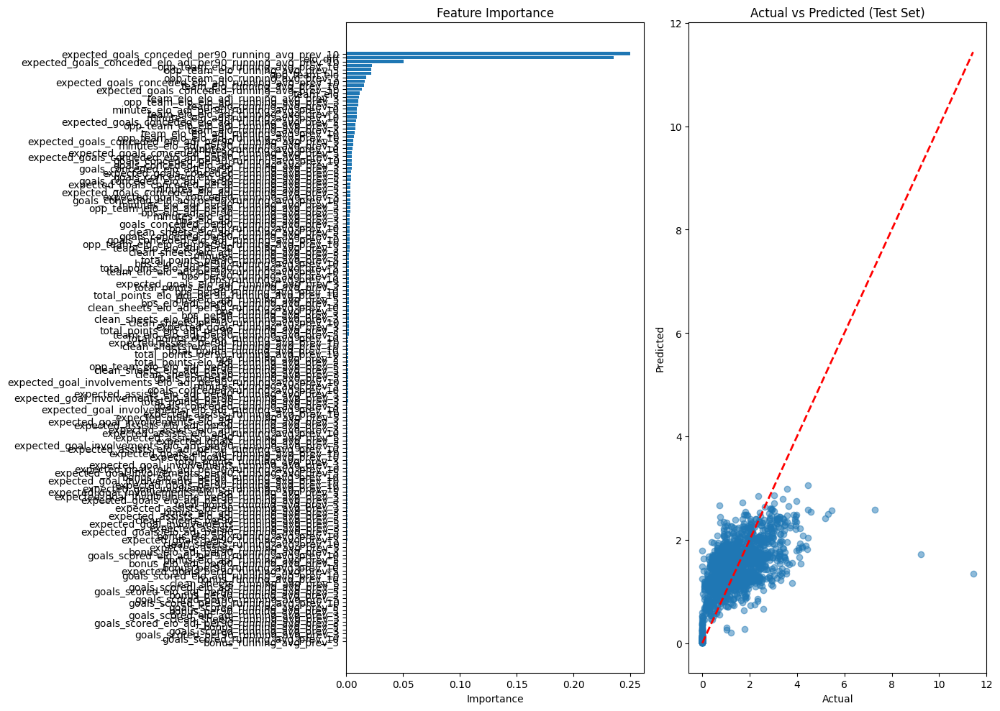

target=expected_goals_conceded_per90, GK_xGC_predictor
Cleaned df size: 2303/3685

Training Set Performance:
R² Score: 0.7227
RMSE: 0.4853
MAE: 0.3749

Test Set Performance:
R² Score: 0.3595
RMSE: 0.7467
MAE: 0.5585

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.210070
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.132329
           expected_goals_conceded_per90_running_avg_prev_10    0.065514
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.051515
                                                opp_team_elo    0.021438
                 expected_goals_conceded_running_avg_prev_10    0.019450
                            opp_team_elo_running_avg_prev_10    0.019379
                   goals_conceded_elo_adj_running_avg_prev_5    0.015585
          expected_goals_conceded_elo_adj_running_avg_prev_5    0.014841
                             opp_

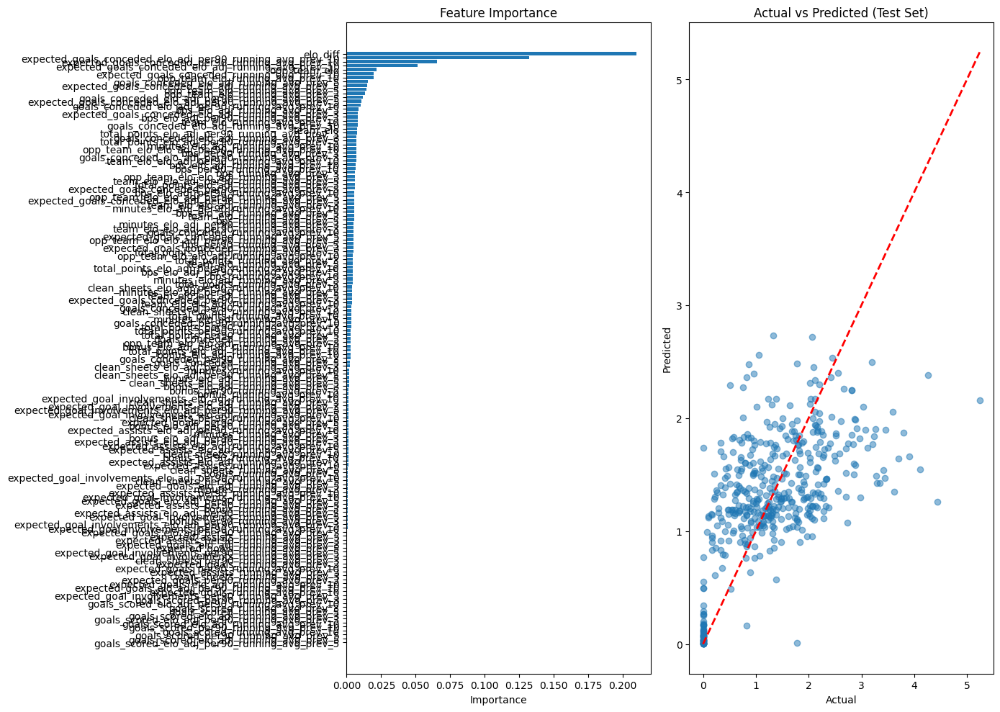

In [211]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_goals_conceded_per90, FWD_xGC_predictor")
    FWD_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xGC_predictor.fit()
    FWD_xGC_predictor.plot_results()

    print("target=expected_goals_conceded_per90, MID_xGC_predictor")
    MID_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xGC_predictor.fit()
    MID_xGC_predictor.plot_results()
    
    print("target=expected_goals_conceded_per90, DEF_xGC_predictor")
    DEF_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xGC_predictor.fit()
    DEF_xGC_predictor.plot_results()

    print("target=expected_goals_conceded_per90, GK_xGC_predictor")
    GK_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_xGC_predictor.fit()
    GK_xGC_predictor.plot_results()

target=bps_per90, FWD_bps_predictor
Cleaned df size: 2410/4130

Training Set Performance:
R² Score: 0.5841
RMSE: 12.4250
MAE: 10.1889

Test Set Performance:
R² Score: -0.0135
RMSE: 19.6553
MAE: 15.4307

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.081001
                                                opp_team_elo    0.023118
                            opp_team_elo_running_avg_prev_10    0.022071
                             opp_team_elo_running_avg_prev_3    0.020109
              clean_sheets_elo_adj_per90_running_avg_prev_10    0.017344
                             opp_team_elo_running_avg_prev_5    0.014709
                             bps_elo_adj_running_avg_prev_10    0.011756
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.011586
    expected_goals_conceded_elo_adj_per90_running_avg_prev_5    0.011369
                 expected_goals_conceded_runnin

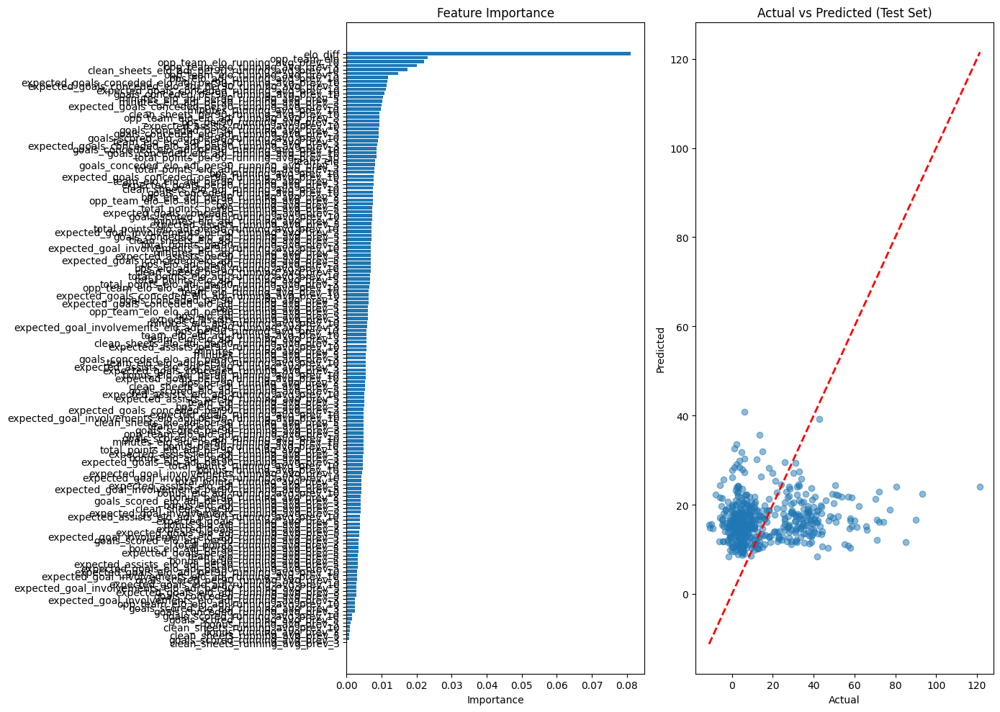

target=bps_per90, MID_bps_predictor
Cleaned df size: 10795/17097

Training Set Performance:
R² Score: 0.3911
RMSE: 9.1599
MAE: 7.0183

Test Set Performance:
R² Score: 0.0495
RMSE: 11.2635
MAE: 8.3519

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.119706
                             opp_team_elo_running_avg_prev_5    0.020556
                            opp_team_elo_running_avg_prev_10    0.020161
                                                opp_team_elo    0.018517
                                     bps_running_avg_prev_10    0.017961
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.015967
                             opp_team_elo_running_avg_prev_3    0.015640
                  expected_assists_per90_running_avg_prev_10    0.013698
                                bps_per90_running_avg_prev_3    0.013161
                               bps_per90_running_

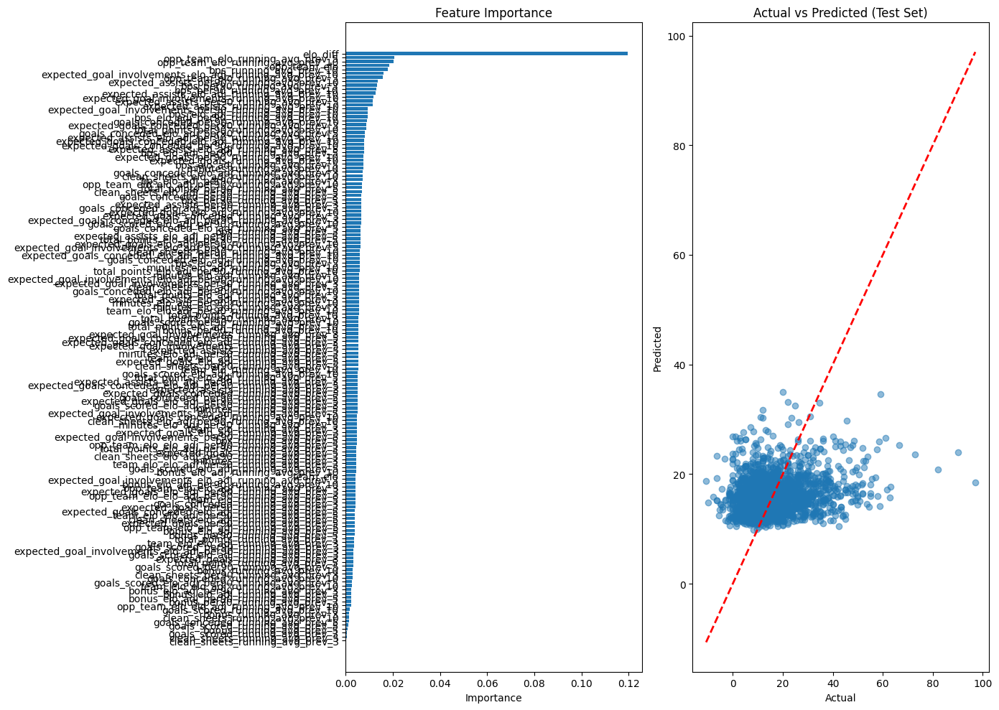

target=bps_per90, DEF_bps_predictor
Cleaned df size: 9299/15098

Training Set Performance:
R² Score: 0.5014
RMSE: 7.1887
MAE: 5.7548

Test Set Performance:
R² Score: 0.1712
RMSE: 9.3691
MAE: 7.3325

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.196758
                                                opp_team_elo    0.034568
                             opp_team_elo_running_avg_prev_5    0.023036
                            opp_team_elo_running_avg_prev_10    0.022909
                             opp_team_elo_running_avg_prev_3    0.020916
                               bps_per90_running_avg_prev_10    0.016511
                                team_elo_running_avg_prev_10    0.015988
                                                    team_elo    0.013714
                                bps_per90_running_avg_prev_5    0.012494
                 expected_goals_conceded_running_av

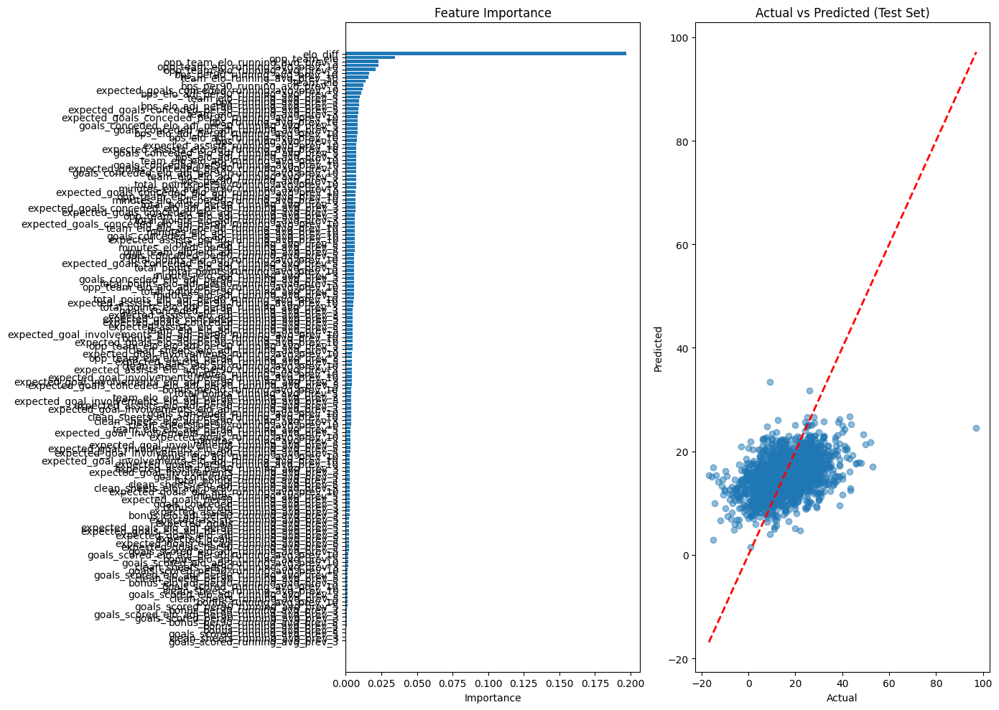

target=bps_per90, GK_bps_predictor
Cleaned df size: 2303/3685

Training Set Performance:
R² Score: 0.6490
RMSE: 5.5044
MAE: 4.5110

Test Set Performance:
R² Score: 0.0853
RMSE: 8.6184
MAE: 6.8520

Feature Importance:
                                                     feature  importance
                            opp_team_elo_running_avg_prev_10    0.037699
                                                opp_team_elo    0.036818
                             opp_team_elo_running_avg_prev_3    0.030419
                                                    elo_diff    0.030012
                               bps_per90_running_avg_prev_10    0.027797
                             opp_team_elo_running_avg_prev_5    0.025480
                                     bps_running_avg_prev_10    0.019386
           expected_goals_conceded_per90_running_avg_prev_10    0.018176
                             bps_elo_adj_running_avg_prev_10    0.018016
                                bps_per90_running_avg

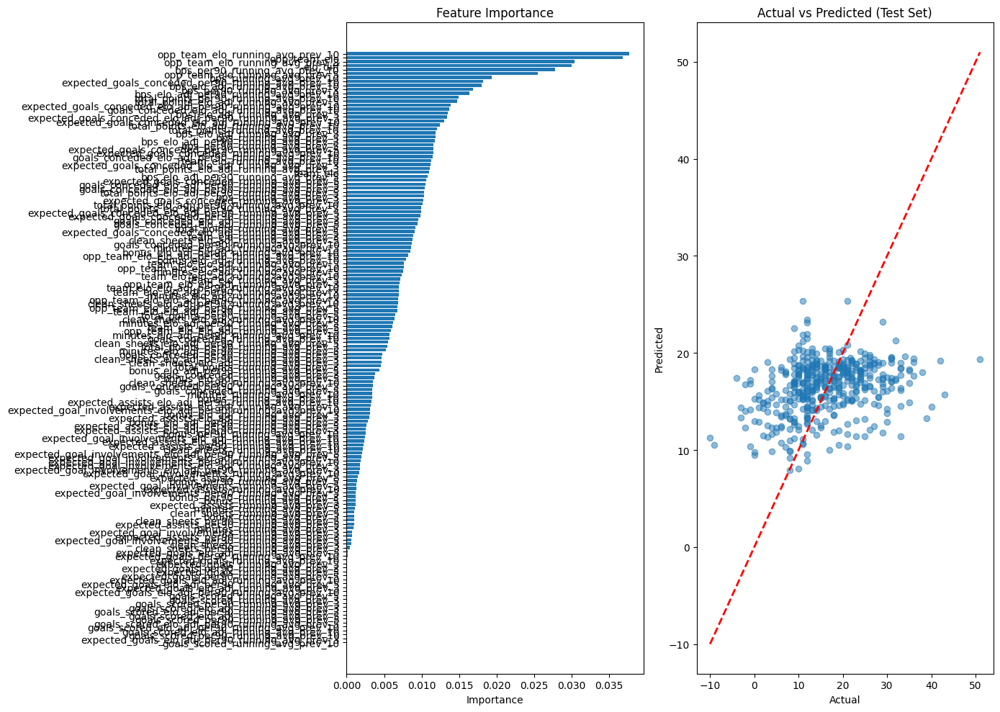

In [212]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=bps_per90, FWD_bps_predictor")
    FWD_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90', # try: 'bonus_per90'
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_bps_predictor.fit()
    FWD_bps_predictor.plot_results()

    print("target=bps_per90, MID_bps_predictor")
    MID_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_bps_predictor.fit()
    MID_bps_predictor.plot_results()
    
    print("target=bps_per90, DEF_bps_predictor")
    DEF_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_bps_predictor.fit()
    DEF_bps_predictor.plot_results()

    print("target=bps_per90, GK_bps_predictor")
    GK_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_bps_predictor.fit()
    GK_bps_predictor.plot_results()

target=saves_per90, GK_saves_predictor
Cleaned df size: 239/3841

Training Set Performance:
R² Score: 0.8415
RMSE: 0.7002
MAE: 0.5525

Test Set Performance:
R² Score: 0.0243
RMSE: 1.4500
MAE: 1.1372

Feature Importance:
                                                     feature  importance
                             opp_team_elo_running_avg_prev_3    0.080106
                            opp_team_elo_running_avg_prev_10    0.040827
                                                    elo_diff    0.036913
                                                opp_team_elo    0.030540
                             opp_team_elo_running_avg_prev_5    0.027998
                                team_elo_running_avg_prev_10    0.019558
                                                    team_elo    0.019385
                                       cbi_per90_alltime_avg    0.019138
                  expected_goals_conceded_running_avg_prev_3    0.019110
                   team_elo_elo_adj_per90_running_

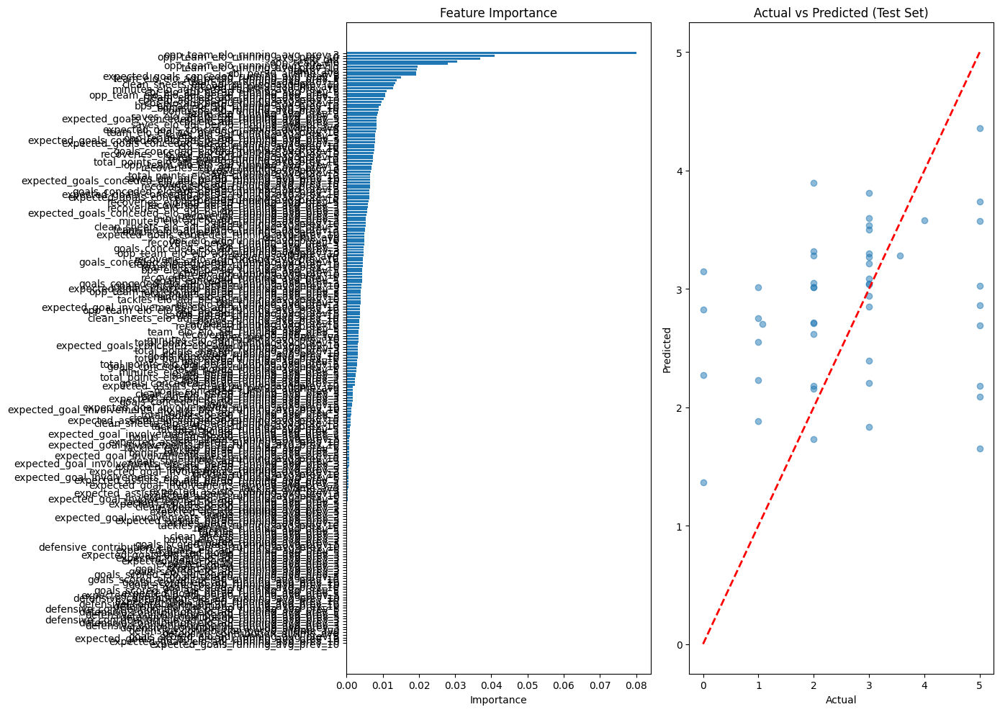

In [213]:
#shots saved
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>0)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=saves_per90, GK_saves_predictor")
    GK_saves_predictor = FPLPredictor(
    data=df[filtered],
    target='saves_per90',
    positions={'GK'})
    GK_saves_predictor.fit()
    GK_saves_predictor.plot_results()

target=defensive_contribution_per90, FWD_defcon_predictor
Cleaned df size: 264/4737

Training Set Performance:
R² Score: 0.8328
RMSE: 1.1627
MAE: 0.9127

Test Set Performance:
R² Score: -0.1749
RMSE: 2.6566
MAE: 1.8543

Feature Importance:
                                                     feature  importance
                             opp_team_elo_running_avg_prev_5    0.034317
                    goals_conceded_per90_running_avg_prev_10    0.019886
     defensive_contribution_elo_adj_per90_running_avg_prev_5    0.019765
                                bps_per90_running_avg_prev_5    0.017061
                                       cbi_per90_alltime_avg    0.015388
                            opp_team_elo_running_avg_prev_10    0.014994
                     goals_conceded_per90_running_avg_prev_5    0.014910
                                recoveries_per90_alltime_avg    0.013912
                 expected_assists_elo_adj_running_avg_prev_3    0.012938
    defensive_contribution_elo

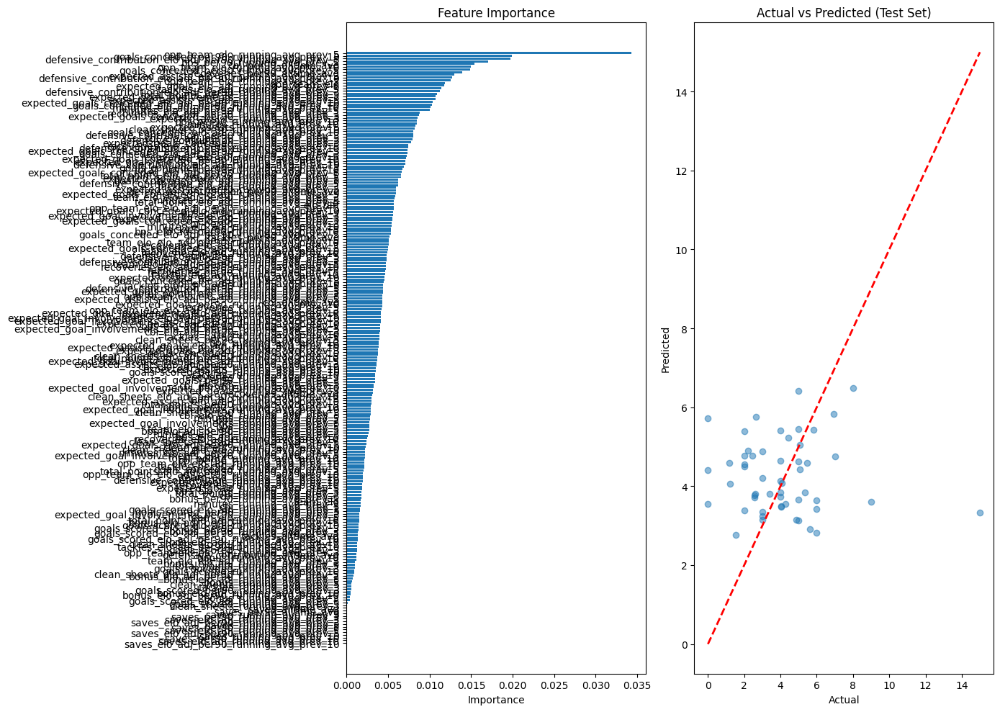

target=defensive_contribution_per90, MID_defcon_predictor
Cleaned df size: 1248/19511

Training Set Performance:
R² Score: 0.8154
RMSE: 1.7661
MAE: 1.4196

Test Set Performance:
R² Score: 0.0907
RMSE: 3.7212
MAE: 3.0112

Feature Importance:
                                                     feature  importance
                                         tackles_alltime_avg    0.042413
                                 tackles_running_avg_prev_10    0.029490
                         tackles_elo_adj_running_avg_prev_10    0.022014
                           tackles_per90_running_avg_prev_10    0.020125
                          defensive_contribution_alltime_avg    0.017381
                               cbi_per90_running_avg_prev_10    0.016149
                   tackles_elo_adj_per90_running_avg_prev_10    0.014730
                    expected_goals_per90_running_avg_prev_10    0.012565
                          tackles_elo_adj_running_avg_prev_5    0.012272
            defensive_contrib

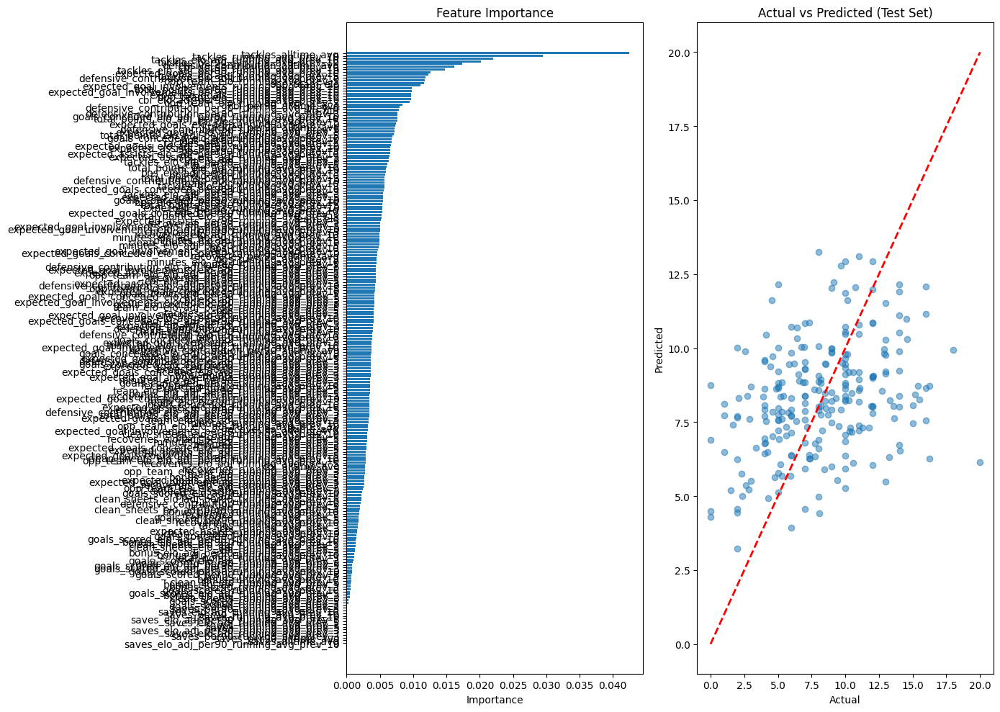

target=defensive_contribution_per90, DEF_defcon_predictor
Cleaned df size: 1030/16490

Training Set Performance:
R² Score: 0.7880
RMSE: 1.7358
MAE: 1.4061

Test Set Performance:
R² Score: 0.0071
RMSE: 3.9955
MAE: 2.9048

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.036572
                                             cbi_alltime_avg    0.035598
                                     cbi_running_avg_prev_10    0.030566
                                                opp_team_elo    0.021901
               opp_team_elo_elo_adj_per90_running_avg_prev_5    0.020299
                             opp_team_elo_running_avg_prev_3    0.016930
                              cbi_elo_adj_running_avg_prev_3    0.015684
                                      cbi_running_avg_prev_3    0.015318
                            opp_team_elo_running_avg_prev_10    0.014268
    expected_goals_conceded_e

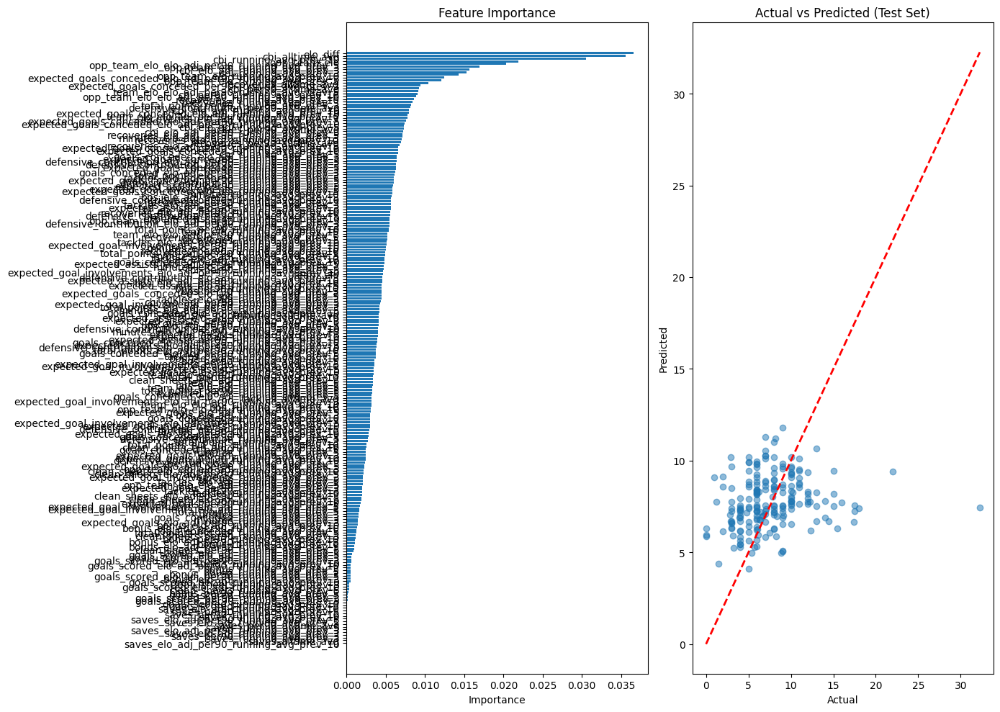

In [214]:
# >10 defcon (CBIT) for a defender
# >12 defcon (CBIT+R) for mid or fwd
filtered = (df['minutes']>30)&(df['player_season_minutes_total']>0)

if __name__ == "__main__":
    
    print("target=defensive_contribution_per90, FWD_defcon_predictor")
    FWD_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'FWD'})
    FWD_defcon_predictor.fit()
    FWD_defcon_predictor.plot_results()

    print("target=defensive_contribution_per90, MID_defcon_predictor")
    MID_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'MID'})
    MID_defcon_predictor.fit()
    MID_defcon_predictor.plot_results()

    print("target=defensive_contribution_per90, DEF_defcon_predictor")
    DEF_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'DEF'})
    DEF_defcon_predictor.fit()
    DEF_defcon_predictor.plot_results()

Goals conceded per 90
Estimated λ (mean goals per match): 1.341


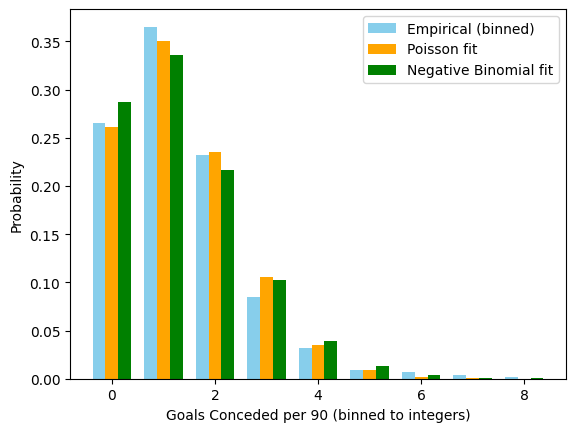

Mean: 1.334, Variance: 1.523
Overdispersion ratio (Var/Mean): 1.142
✅ Poisson assumption looks reasonable.
P(X < 1 goal) = 0.262


In [215]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("Goals conceded per 90")

# Compute xGC per 90
df['xgc_p90'] = (df['expected_goals_conceded'] / df['minutes']) * 90

# Filter to reasonable samples
data = df[(df['minutes'] > 0) & (df['xgc_p90'] < 8)]['xgc_p90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean goals per match): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('Goals Conceded per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")

# --- Example probability ---
p_less_than_1 = poisson.cdf(0, mu=lambda_hat)
print(f"P(X < 1 goal) = {p_less_than_1:.3f}")


Mids & Forwards
Estimated λ (mean defcon per 90): 8.252


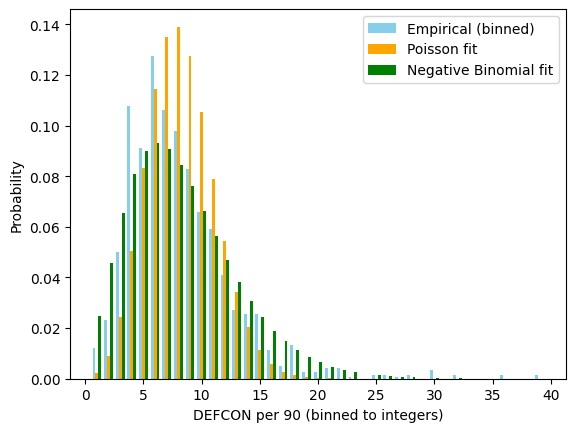

Mean: 8.246, Variance: 22.335
Overdispersion ratio (Var/Mean): 2.709
⚠️ Likely overdispersed → Negative Binomial may fit better.


In [216]:
#Test if defcon_p90 is neg binom distributed

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("Mids & Forwards")

# Filter to reasonable samples
data = df[(df['minutes'] > 0)
          & (df['defensive_contribution_per90'] > 0) 
          & (df['defensive_contribution_per90'] < 40)
          & (df['position'].isin(['DEF']))]['defensive_contribution_per90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean defcon per 90): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('DEFCON per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")


GK saves per 90
Estimated λ (mean defcon per 90): 3.217


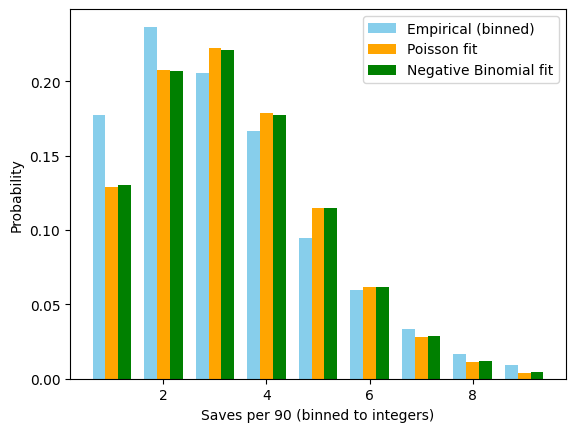

Mean: 3.217, Variance: 3.264
Overdispersion ratio (Var/Mean): 1.015
✅ Poisson assumption looks reasonable.


In [217]:
#Test if saves_p90 is neg binom distributed

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("GK saves per 90")

# Filter to reasonable samples
data = df[#(df['minutes'] > 0)
          (df['saves_per90'] > 0) 
          & (df['saves_per90'] < 10)
          & (df['position'].isin(['GK']))]['saves_per90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean defcon per 90): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('Saves per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")


                                 OLS Regression Results                                
Dep. Variable:                  bonus   R-squared (uncentered):                   0.447
Model:                            OLS   Adj. R-squared (uncentered):              0.447
Method:                 Least Squares   F-statistic:                          3.214e+04
Date:                Tue, 02 Dec 2025   Prob (F-statistic):                        0.00
Time:                        12:42:21   Log-Likelihood:                         -37556.
No. Observations:               39840   AIC:                                  7.511e+04
Df Residuals:                   39839   BIC:                                  7.512e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

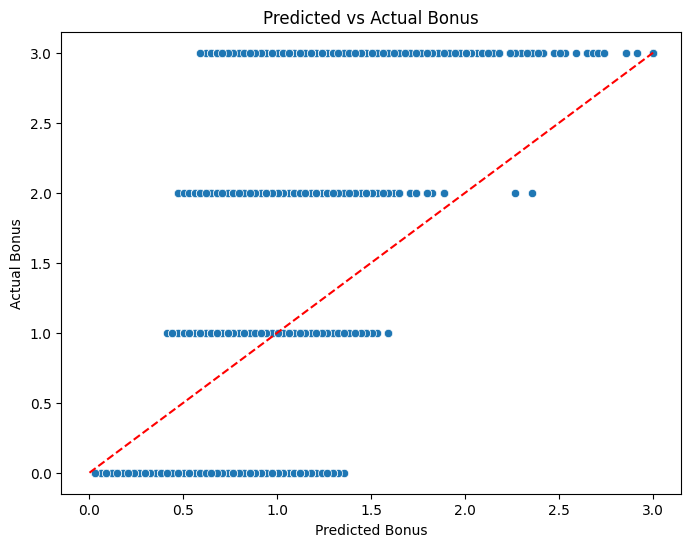

Actual Bonus       0.0       1.0       2.0       3.0
Position                                            
DEF           0.459319  0.232228  1.108192  1.951325
FWD           0.332663  0.199721  1.049661  1.710986
GK            0.491958  0.246645  1.116735  2.013744
GKP                NaN       NaN       NaN       NaN
MID           0.394157  0.246776  1.052218  1.827500


In [218]:
# Generalize the relationship between bps & bonus points
import statsmodels.formula.api as smf
filtered = (df['minutes']>45) & (df['bonus']>=0) & (df['bps']>0) & (df['position'].isin(['GK','DEF','MID','FWD']))
# df['bonus_sq'] = df['bonus']**2

model = smf.ols('bonus ~ bps -1', data=df[filtered]).fit()
print(model.summary())

df['bonus_pred'] = model.predict(df[filtered])
df['bonus_pred'] = np.clip(df['bonus_pred'], 0, 3) # clip prediction to 3

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(x='bonus_pred', y='bonus', data=df)
plt.plot([df['bonus'].min(), df['bonus'].max()],
         [df['bonus'].min(), df['bonus'].max()],
         color='red', linestyle='--')  # 45-degree line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs Actual Bonus')
plt.show()

import pandas as pd
import numpy as np

# Function to calculate RMSE
def rmse(actual, predicted):
    return np.sqrt(np.mean((actual - predicted) ** 2))

# Group by position and actual bonus, then calculate RMSE
rmse_table = df.groupby(['position', 'bonus']).apply(lambda x: rmse(x['bonus'], x['bonus_pred']))

# Convert to DataFrame
rmse_table = rmse_table.reset_index()
rmse_table.columns = ['Position', 'Actual Bonus', 'RMSE']

pivot_rmse = rmse_table.pivot(index='Position', columns='Actual Bonus', values='RMSE')
print(pivot_rmse)


In [219]:
prediction_data = df[(df['season']==20252026)
                     &(df['event']>=stats_current_gameweek+1)]

In [220]:
prediction_data.pivot_table(index='event',values='minutes',aggfunc='count')

,minutes
event,
14.0,0
15.0,0
16.0,0
17.0,0
18.0,0
19.0,0
20.0,0
21.0,0
22.0,0


In [221]:
def predict_target_vectorized(df, model_dict, col_name):
    preds = []
    
    for pos, model in model_dict.items():
        subset = df[df['position'] == pos]
        if not subset.empty:
            pos_preds = model.predict_new(subset)
            temp = subset.copy()
            temp[col_name] = pos_preds
            preds.append(temp)
    
    if not preds:
        # If no positions matched at all
        return pd.Series(index=df.index, dtype=float)
    
    result = pd.concat(preds)
    
    # Safely align back to original DataFrame
    output = pd.Series(index=df.index, dtype=float)
    output.loc[result.index] = result[col_name]
    return output

In [222]:
target_col_name = 'mins_pred'
mins_model_dict = {'FWD': FWD_mins_predictor, 'MID': MID_mins_predictor, 'DEF': DEF_mins_predictor, 'GK': GK_mins_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, mins_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_17412\2521843321.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, mins_model_dict, col_name=target_col_name)


count    11375.000000
mean        42.801495
std         29.279633
min          0.902044
25%         15.104758
50%         42.371914
75%         71.283448
max         87.651132
Name: mins_pred, dtype: float64

In [223]:
target_col_name = 'xgp90_pred'
xg_model_dict = {'FWD': FWD_xG_predictor, 'MID': MID_xG_predictor, 'DEF': DEF_xG_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xg_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_17412\365369552.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xg_model_dict, col_name=target_col_name)


count    10650.000000
mean         0.138975
std          0.123359
min          0.009213
25%          0.050808
50%          0.091120
75%          0.181040
max          0.866217
Name: xgp90_pred, dtype: float64

In [224]:
target_col_name = 'xap90_pred'
xA_model_dict = {'FWD': FWD_xA_predictor, 'MID': MID_xA_predictor, 'DEF': DEF_xA_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xA_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_17412\4144355699.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xA_model_dict, col_name=target_col_name)


count    10650.000000
mean         0.081551
std          0.048127
min          0.012416
25%          0.047104
50%          0.068573
75%          0.108730
max          0.336718
Name: xap90_pred, dtype: float64

In [225]:
target_col_name = 'xgcp90_pred'
xGC_model_dict = {'FWD': FWD_xGC_predictor, 'MID': MID_xGC_predictor, 'DEF': DEF_xGC_predictor, 'GK':GK_xGC_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xGC_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_17412\682035545.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xGC_model_dict, col_name=target_col_name)


count    11375.000000
mean         1.421521
std          0.384047
min          0.470722
25%          1.149423
50%          1.354708
75%          1.676994
max          2.784495
Name: xgcp90_pred, dtype: float64

In [226]:
target_col_name = 'xbpsp90_pred'
bps_model_dict = {'FWD': FWD_bps_predictor, 'MID': MID_bps_predictor, 'DEF': DEF_bps_predictor, 'GK':GK_bps_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, bps_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_17412\3051138591.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, bps_model_dict, col_name=target_col_name)


count    11375.000000
mean        15.192043
std          3.318925
min          3.647025
25%         13.024714
50%         15.020109
75%         17.197337
max         32.889916
Name: xbpsp90_pred, dtype: float64

In [227]:
target_col_name = 'xsavesp90_pred'
saves_model_dict = {'GK':GK_saves_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, saves_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_17412\803536942.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, saves_model_dict, col_name=target_col_name)


count    725.000000
mean       2.934722
std        0.567373
min        1.532900
25%        2.561339
50%        2.947416
75%        3.257032
max        4.251515
Name: xsavesp90_pred, dtype: float64

In [228]:
target_col_name = 'xdefconp90_pred'
defcon_model_dict = {'FWD': FWD_defcon_predictor, 'MID': MID_defcon_predictor, 'DEF': DEF_defcon_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, defcon_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_17412\2777375241.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, defcon_model_dict, col_name=target_col_name)


count    10650.000000
mean         7.474960
std          1.803668
min          2.590977
25%          6.411535
50%          7.440481
75%          8.692132
max         13.180552
Name: xdefconp90_pred, dtype: float64

In [229]:
prediction_data[prediction_data['position']=='MID'].head()[["player_name_id","element","value","team_name","position","season","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xgcp90_pred'
    ]]

,player_name_id,element,value,team_name,position,season,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xgcp90_pred
129755,Antoni Milambo,122.0,52.0,Brentford,MID,20252026.0,17.0,Wolves,917.944412,1.503526,0.158846,0.135048,1.535727
129807,Antoni Milambo,122.0,52.0,Brentford,MID,20252026.0,18.0,Bournemouth,1054.800148,1.503526,0.133470,0.035878,1.210264
129812,Antoni Milambo,122.0,52.0,Brentford,MID,20252026.0,19.0,Spurs,1000.086517,1.503526,0.140021,0.035248,1.418441
129817,Antoni Milambo,122.0,52.0,Brentford,MID,20252026.0,20.0,Everton,1054.902805,1.503526,0.133470,0.035878,1.210264
129822,Antoni Milambo,122.0,52.0,Brentford,MID,20252026.0,21.0,Sunderland,1041.902328,1.503526,0.133263,0.035878,1.482725


In [230]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>0)
    ][["player_name_id","element","value","team_name","position","season","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xgcp90_pred'
    ]].sort_values(by='xgp90_pred',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,season,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xgcp90_pred
134314,Erling Haaland,430.0,149.0,Man City,FWD,20252026.0,14.0,Fulham,1036.394443,78.103456,0.795313,0.060832,1.286735
139792,Liam Delap,250.0,62.0,Chelsea,FWD,20252026.0,14.0,Leeds,915.108651,47.560574,0.721502,0.170786,0.841423
137319,Jean-Philippe Mateta,283.0,81.0,Crystal Palace,FWD,20252026.0,14.0,Burnley,890.090321,73.021996,0.687646,0.059880,1.019232
140406,Marc Guiu Paz,252.0,42.0,Chelsea,FWD,20252026.0,14.0,Leeds,915.108651,23.654422,0.635837,0.157484,1.112045
138376,João Pedro Junqueira de Jesus,249.0,75.0,Chelsea,FWD,20252026.0,14.0,Leeds,915.108651,66.344137,0.634801,0.122601,0.821717
132377,Christantus Uche,732.0,55.0,Crystal Palace,FWD,20252026.0,14.0,Burnley,890.090321,9.451954,0.601864,0.052962,1.173083
134153,Enes Ünal,98.0,54.0,Bournemouth,FWD,20252026.0,14.0,Everton,1054.902805,22.174398,0.585638,0.147525,1.633493
146171,Viktor Gyökeres,666.0,88.0,Arsenal,FWD,20252026.0,14.0,Brentford,1063.038520,37.543134,0.574469,0.113032,1.115593
130161,Alexander Isak,499.0,104.0,Liverpool,FWD,20252026.0,14.0,Sunderland,1041.902328,49.461741,0.524491,0.074440,0.981806
141891,Mohamed Salah,381.0,142.0,Liverpool,MID,20252026.0,14.0,Sunderland,1041.902328,63.434245,0.500853,0.210874,1.154009


In [231]:
import pandas as pd
from scipy.stats import nbinom

def calculate_negbinom_parameters(position_list, df):

    # 1. Calculate mean and variance
    filtered = (df['minutes'] > 0) & (df['defensive_contribution_per90'] > 0) & (df['defensive_contribution_per90'] < 40) & (df['position'].isin(position_list))
    mean = df[filtered]['defensive_contribution_per90'].mean()
    variance = df[filtered]['defensive_contribution_per90'].var()
    # r = number of successes
    r = (mean**2) / (variance - mean)
    # p = success probability
    p = r / (r + mean)
    return r,p

In [232]:
from scipy.stats import poisson
import numpy as np

def expected_score(mu, max_events=10, rule=None, points_per_n=None, points_value=None):
    """
    Calculate the expected score given an average event rate (mu)
    using a Poisson model.

    Parameters
    ----------
    mu : float
        Expected number of events (e.g., goals conceded, shots saved).
    max_events : int
        Maximum number of discrete events to sum over.
    rule : callable, optional
        Function that maps event count -> points. Example: lambda k: -np.floor(k / 2)
    points_per_n : int, optional
        For simple rules: number of events required for one point (e.g. 3 shots saved = 1 pt)
    points_value : float, optional
        Value of that one point (e.g. +1 for shots saved, -1 for goals conceded)

    Returns
    -------
    float
        Expected points based on Poisson-distributed event counts.
    """
    array = np.arange(0, max_events + 1)
    probs = poisson.pmf(array, mu)

    if rule is not None:
        scores = np.array([rule(k) for k in array])
    elif points_per_n is not None and points_value is not None:
        # General simple rule: 1 point_value for every n events
        scores = np.floor(array / points_per_n) * points_value
    else:
        raise ValueError("You must provide either a rule function or both points_per_n and points_value.")

    return np.sum(scores * probs)


In [233]:
scoring_dict = {
    "FWD": {'xgp90_pred': 4, 'xap90_pred': 3, 'xgcp90_pred': 0, 'xgc_ss':0, 'defcon':2},
    "MID": {'xgp90_pred': 5, 'xap90_pred': 3, 'xgcp90_pred': 1, 'xgc_ss':0, 'defcon':2},
    "DEF": {'xgp90_pred': 6, 'xap90_pred': 3, 'xgcp90_pred': 4, 'xgc_ss':-1, 'defcon':2},
    "GK":  {'xgp90_pred': 10, 'xap90_pred': 3, 'xgcp90_pred': 4, 'xgc_ss':-1, 'defcon':2}
}

def scoring(x, scoring_dict, points_type, negbinom_rp_dict=None):
    mins_factor = x['mins_pred']/90
    if points_type == 'mins':
        if pd.isna(x['mins_pred']):
            return 0
        elif x['mins_pred'] >= 60:
            return 2
        elif x['mins_pred'] > 0:
            return 1
        else:
            return 0
    if points_type == 'goals':
        goals_points = mins_factor * x['xgp90_pred'] * scoring_dict[x['position']]['xgp90_pred']
        return goals_points
    if points_type == 'assists':
        assist_points = mins_factor * x['xap90_pred'] * scoring_dict[x['position']]['xap90_pred']
        return assist_points
    if points_type == 'clean_sheets':
        p_less_than_1 = poisson.cdf(0, mu=x['xgcp90_pred'])
        cs_points = p_less_than_1 * scoring_dict[x['position']]['xgcp90_pred']
        return cs_points
    
    if points_type == 'shots_saved': 
        if x['position'] == 'GK':
            saves_points = expected_score(mu=x['xsavesp90_pred'],  # expected shots saved per 90
                                   max_events=15,
                                   points_per_n=3, #for every 3 shots saved
                                   points_value=1) #scores 1 point
            return saves_points
        else:
            return 0
        
    if points_type == 'goals_conceded':
        if x['position'] in ['DEF','GK']:
            gc_points = expected_score(mu=x['xgcp90_pred'], 
                                   max_events=10, 
                                   points_per_n=2, #for every 2 goals conceded 
                                   points_value=-1) #scores -1 points 
            return gc_points
        else:
            return 0

    if points_type == 'defcon':
        pos = x['position']
        if pos in ['MID','FWD']:
            r = negbinom_rp_dict[pos]['r']
            p = negbinom_rp_dict[pos]['p']
            k = 12
            prob_more_than_12 = 1 - nbinom.cdf(k, r, p)
            defcon_points = prob_more_than_12 * scoring_dict[pos]['defcon']
            return defcon_points
        elif pos == 'DEF':
            r = negbinom_rp_dict[pos]['r']
            p = negbinom_rp_dict[pos]['p']
            k = 10
            prob_more_than_12 = 1 - nbinom.cdf(k, r, p)
            defcon_points = prob_more_than_12 * scoring_dict[pos]['defcon']
            return defcon_points
        else: return 0

    if points_type == 'bonus':
        return x['xbpsp90_pred']*0.0294 # ols regression coefficient

prediction_data['xpoints_mins'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='mins'), axis=1)
prediction_data['xpoints_goals'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals'), axis=1)
prediction_data['xpoints_assists'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='assists'), axis=1)
prediction_data['xpoints_clean_sheets'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='clean_sheets'), axis=1)

prediction_data['xpoints_shots_saved'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='shots_saved'), axis=1)
prediction_data['xpoints_goals_conceded'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals_conceded'), axis=1)

def_r,def_p = calculate_negbinom_parameters(['DEF'], df)
mid_r,mid_p = calculate_negbinom_parameters(['MID'], df)
fwd_r,fwd_p = calculate_negbinom_parameters(['FWD'], df)
rp_dict = {'DEF':{'r':def_r,'p':def_p},'MID':{'r':mid_r,'p':mid_p},'FWD':{'r':fwd_r,'p':fwd_p}}
prediction_data['xpoints_defcon'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='defcon', negbinom_rp_dict=rp_dict), axis=1)
prediction_data['xpoints_bonus'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='bonus'), axis=1)

prediction_data['xpoints'] = prediction_data[['xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets',
                                              'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus']].sum(axis=1, skipna=True)

C:\Users\chris\AppData\Local\Temp\ipykernel_17412\282654768.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data['xpoints_mins'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='mins'), axis=1)
C:\Users\chris\AppData\Local\Temp\ipykernel_17412\282654768.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data['xpoints_goals'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals'), axis=1)
C:\Users\chris\AppData\Local\Temp\ipykernel_

In [234]:
predictions = prediction_data[['player_name_id', 'team_name','team_elo','element','position','opp_team_name','opp_team_elo', 'season', 'value', 'event',
                       'mins_pred', 'xgp90_pred', 'xap90_pred', 'xgcp90_pred',
                       'xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets','xpoints_shots_saved',
                       'xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                       'xpoints']]
predictions

,player_name_id,team_name,team_elo,element,position,opp_team_name,opp_team_elo,season,value,event,...,xgcp90_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
129673,Altay Bayındır,Man Utd,1057.680800,431.0,GK,Aston Villa,1146.622491,20252026.0,48.0,17.0,...,1.884506,1,NaN,NaN,0.607616,0.547717,-0.697997,0.000000,0.370818,1.828154
129681,Aaron Hickey,Brentford,1063.038520,116.0,DEF,Arsenal,1245.789428,20252026.0,40.0,14.0,...,2.138744,1,0.157764,0.052138,0.471211,0.000000,-0.822762,0.549426,0.278428,1.686205
129683,Aaron Hickey,Brentford,1063.038520,116.0,DEF,Spurs,1000.086517,20252026.0,40.0,15.0,...,1.230139,1,0.185080,0.078328,1.169008,0.000000,-0.386422,0.549426,0.481966,3.077386
129684,Aaron Hickey,Brentford,1063.038520,116.0,DEF,Leeds,915.108651,20252026.0,40.0,16.0,...,1.163918,1,0.193626,0.081010,1.249041,0.000000,-0.356335,0.549426,0.550627,3.267394
129686,Aaron Hickey,Brentford,1063.038520,116.0,DEF,Wolves,917.944412,20252026.0,40.0,17.0,...,1.168368,1,0.193626,0.081010,1.243495,0.000000,-0.358344,0.549426,0.544406,3.253618
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146946,Álex Jiménez Sánchez,Bournemouth,1054.800148,713.0,DEF,Leeds,915.108651,20252026.0,45.0,34.0,...,1.081092,1,0.065146,0.045777,1.356900,0.000000,-0.319314,0.549426,0.461962,3.159897
146947,Álex Jiménez Sánchez,Bournemouth,1054.800148,713.0,DEF,Crystal Palace,1094.251425,20252026.0,45.0,35.0,...,1.387304,1,0.060255,0.037278,0.998991,0.000000,-0.459244,0.549426,0.365411,2.552117
146948,Álex Jiménez Sánchez,Bournemouth,1054.800148,713.0,DEF,Fulham,1036.394443,20252026.0,45.0,36.0,...,1.318813,1,0.060381,0.040292,1.069810,0.000000,-0.427289,0.549426,0.403929,2.696549
146949,Álex Jiménez Sánchez,Bournemouth,1054.800148,713.0,DEF,Man City,1218.952466,20252026.0,45.0,37.0,...,1.666943,1,0.060197,0.031446,0.755294,0.000000,-0.592377,0.549426,0.259560,2.063545


In [235]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>60)
    #&(prediction_data['position'].isin(['MID','FWD']))
    ][["player_name_id","element","value","team_name","position","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xdefconp90_pred','xbpsp90_pred','xpoints'
    ]].sort_values(by='xpoints',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xdefconp90_pred,xbpsp90_pred,xpoints
131893,Bukayo Saka,16.0,101.0,Arsenal,MID,14.0,Brentford,1063.038520,80.652894,0.399450,0.247264,7.559867,21.758596,6.018067
134314,Erling Haaland,430.0,149.0,Man City,FWD,14.0,Fulham,1036.394443,78.103456,0.795313,0.060832,4.429756,21.358138,5.792425
140408,Marc Cucurella Saseta,224.0,61.0,Chelsea,DEF,14.0,Leeds,915.108651,84.458829,0.060406,0.107809,5.776613,22.757796,5.777923
145900,Trevoh Chalobah,226.0,51.0,Chelsea,DEF,14.0,Leeds,915.108651,84.044226,0.080677,0.053537,8.421889,21.414895,5.705907
140331,Malo Gusto,228.0,49.0,Chelsea,DEF,14.0,Leeds,915.108651,61.951676,0.079523,0.080510,6.287321,25.725345,5.609646
141891,Mohamed Salah,381.0,142.0,Liverpool,MID,14.0,Sunderland,1041.902328,63.434245,0.500853,0.210874,3.790637,18.506688,5.566416
142488,Nico O'Reilly,411.0,51.0,Man City,DEF,14.0,Fulham,1036.394443,76.643301,0.152164,0.262989,7.999082,21.724907,5.560037
134204,Enzo Fernández,237.0,67.0,Chelsea,MID,14.0,Leeds,915.108651,82.731829,0.275710,0.192648,8.157289,22.402406,5.488385
143583,Phil Foden,414.0,80.0,Man City,MID,14.0,Fulham,1036.394443,83.952756,0.271537,0.201201,6.926623,20.528138,5.315395
133738,Eberechi Eze,266.0,77.0,Arsenal,MID,14.0,Brentford,1063.038520,78.658476,0.286432,0.191455,7.138275,20.001788,5.262657


In [237]:
table_name = "predictions"
if __name__ == "__main__":
    db_creator.create_staging_table_then_insert_data(table_name, data=predictions)
    preds = db_creator.table_to_df(table_name=table_name)
    print(preds.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11375 entries, 0 to 11374
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   player_name_id          11375 non-null  object 
 1   team_name               11375 non-null  object 
 2   team_elo                11375 non-null  float64
 3   element                 11375 non-null  float64
 4   position                11375 non-null  object 
 5   opp_team_name           11375 non-null  object 
 6   opp_team_elo            11375 non-null  float64
 7   season                  11375 non-null  float64
 8   value                   11375 non-null  float64
 9   event                   11375 non-null  float64
 10  mins_pred               11375 non-null  float64
 11  xgp90_pred              10650 non-null  float64
 12  xap90_pred              10650 non-null  float64
 13  xgcp90_pred             11375 non-null  float64
 14  xpoints_mins            11375 non-null

In [238]:
# Add new columns to the xPoints table
db_creator.execute_sql("""
    ALTER TABLE predictions
    ADD COLUMN IF NOT EXISTS in_any_team INTEGER DEFAULT 0,
    ADD COLUMN IF NOT EXISTS in_my_team INTEGER DEFAULT 0
""")

In [239]:
current_gameweek = picks_current_gameweek
my_name = "Christopher Harris"

# Get the player lists
view = db_creator.run_sql(f"""
    WITH 
    current_players AS (
        SELECT element
        FROM fpl_picks
        WHERE gw = {current_gameweek}
    ),
    my_players AS (
        SELECT element
        FROM fpl_picks
        WHERE gw = {current_gameweek}
        AND member = '{my_name}'
    )
    SELECT * FROM my_players
""")

# Update the flags
db_creator.execute_sql(f"""
    UPDATE predictions
    SET in_any_team = 1
    WHERE element IN (
        SELECT element 
        FROM fpl_picks 
        WHERE gw = {current_gameweek}
    )
""")

db_creator.execute_sql(f"""
    UPDATE predictions
    SET in_my_team = 1
    WHERE element IN (
        SELECT element 
        FROM fpl_picks 
        WHERE gw = {current_gameweek}
        AND member = '{my_name}'
    )
""")

In [240]:
print(f"Gameweek {picks_current_gameweek+1} Predictions")
prediction_data[
    prediction_data['event']==picks_current_gameweek+1
][["player_name_id","element",'event',"value","team_name","position","opp_team_name","opp_team_elo"
   ,'mins_pred', 'xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets', 
   'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
   'xpoints'
   ]].sort_values(by='xpoints',ascending=False
    ).head(10)

Gameweek 14 Predictions


,player_name_id,element,event,value,team_name,position,opp_team_name,opp_team_elo,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
131893,Bukayo Saka,16.0,14.0,101.0,Arsenal,MID,Brentford,1063.038520,80.652894,2,1.789822,0.664752,0.427796,0.0,0.000000,0.495993,0.639703,6.018067
134314,Erling Haaland,430.0,14.0,149.0,Man City,FWD,Fulham,1036.394443,78.103456,2,2.760740,0.158373,0.000000,0.0,0.000000,0.245382,0.627929,5.792425
140408,Marc Cucurella Saseta,224.0,14.0,61.0,Chelsea,DEF,Leeds,915.108651,84.458829,2,0.340122,0.303513,2.063296,0.0,-0.147513,0.549426,0.669079,5.777923
145900,Trevoh Chalobah,226.0,14.0,51.0,Chelsea,DEF,Leeds,915.108651,84.044226,2,0.452027,0.149983,2.071018,0.0,-0.146144,0.549426,0.629598,5.705907
140331,Malo Gusto,228.0,14.0,49.0,Chelsea,DEF,Leeds,915.108651,61.951676,2,0.328438,0.166257,1.973330,0.0,-0.164130,0.549426,0.756325,5.609646
141891,Mohamed Salah,381.0,14.0,142.0,Liverpool,MID,Sunderland,1041.902328,63.434245,2,1.765069,0.445887,0.315370,0.0,0.000000,0.495993,0.544097,5.566416
142488,Nico O'Reilly,411.0,14.0,51.0,Man City,DEF,Fulham,1036.394443,76.643301,2,0.777492,0.671879,1.271011,0.0,-0.348482,0.549426,0.638712,5.560037
134204,Enzo Fernández,237.0,14.0,67.0,Chelsea,MID,Leeds,915.108651,82.731829,2,1.267223,0.531270,0.535268,0.0,0.000000,0.495993,0.658631,5.488385
143583,Phil Foden,414.0,14.0,80.0,Man City,MID,Fulham,1036.394443,83.952756,2,1.266459,0.563045,0.386370,0.0,0.000000,0.495993,0.603527,5.315395
133738,Eberechi Eze,266.0,14.0,77.0,Arsenal,MID,Brentford,1063.038520,78.658476,2,1.251682,0.501987,0.424942,0.0,0.000000,0.495993,0.588053,5.262657


In [241]:
current_gameweek=picks_current_gameweek
print(f"Next 5 GWs: GW{current_gameweek+1} - GW{current_gameweek+5}")
next_5_gws_filter = (prediction_data['event']>=current_gameweek)&(prediction_data['event']<=current_gameweek+5)
prediction_data[next_5_gws_filter].groupby('player_name_id')[['mins_pred', 'xpoints_mins', 'xpoints_goals', 
                                           'xpoints_assists', 'xpoints_clean_sheets', 'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                                           'xpoints'
                                           ]].agg('sum').reset_index().sort_values(by='xpoints',ascending=False).head(10)

Next 5 GWs: GW14 - GW18


,player_name_id,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
57,Bukayo Saka,403.480356,10,8.666519,3.259139,2.275108,0.0,0.000000,2.479967,3.217977,29.898709
319,Mohamed Salah,316.896788,10,8.792675,2.351798,1.939654,0.0,0.000000,2.479967,2.894304,28.458396
336,Nico O'Reilly,383.894981,10,3.905525,3.359291,6.947299,0.0,-1.621668,2.747129,3.115851,28.453426
120,Erling Haaland,390.149902,10,13.085605,0.803554,0.000000,0.0,0.000000,1.226910,3.088561,28.204629
168,Igor Thiago Nascimento Rodrigues,412.165758,10,11.341517,0.946835,0.000000,0.0,0.000000,1.226910,3.190696,26.705957
364,Phil Foden,419.623283,10,6.307780,2.821106,2.000032,0.0,0.000000,2.479967,3.074553,26.683438
106,Eberechi Eze,391.155457,10,6.265441,2.522262,2.216222,0.0,0.000000,2.479967,2.958173,26.442065
73,Cody Gakpo,318.002979,10,5.606007,2.266048,2.087783,0.0,0.000000,2.479967,3.098349,25.538154
118,Enzo Fernández,414.332644,10,6.100357,2.381042,1.638754,0.0,0.000000,2.479967,2.822602,25.422722
54,Bruno Borges Fernandes,420.024904,10,5.890385,2.511057,1.400913,0.0,0.000000,2.479967,2.683375,24.965697


In [242]:
print("Rest of Season Predictions")
prediction_data.groupby('player_name_id')[['mins_pred', 'xpoints_mins', 'xpoints_goals', 
                                           'xpoints_assists', 'xpoints_clean_sheets', 
                                           'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                                           'xpoints'
                                           ]].agg('sum').reset_index().sort_values(by='xpoints',ascending=False).head(10)

Rest of Season Predictions


,player_name_id,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
57,Bukayo Saka,2017.227629,50,43.495072,16.224988,11.378435,0.0,0.000000,12.399833,16.463605,149.961932
319,Mohamed Salah,1577.873275,50,42.762586,11.069683,8.181428,0.0,0.000000,12.399833,13.941452,138.354983
336,Nico O'Reilly,1918.254535,50,19.659752,16.616074,32.038746,0.0,-9.331868,13.735645,14.881707,137.600056
120,Erling Haaland,1927.526368,50,58.713150,4.006515,0.000000,0.0,0.000000,6.134548,15.005905,133.860117
106,Eberechi Eze,1944.567555,50,31.334243,12.535720,11.167718,0.0,0.000000,12.399833,15.122447,132.559962
364,Phil Foden,2098.599103,50,31.226750,13.561658,9.268688,0.0,0.000000,12.399833,15.091795,131.548723
118,Enzo Fernández,2071.907277,50,30.479178,12.178297,7.861710,0.0,0.000000,12.399833,13.940921,126.859940
168,Igor Thiago Nascimento Rodrigues,2057.953730,50,49.193430,4.626949,0.000000,0.0,0.000000,6.134548,15.547823,125.502749
93,Declan Rice,2060.846842,50,21.835857,14.553543,11.074025,0.0,0.000000,12.399833,15.199566,125.062825
54,Bruno Borges Fernandes,2100.295097,50,29.387601,12.392585,6.781083,0.0,0.000000,12.399833,13.405968,124.367069


In [243]:
from datetime import datetime

# Add the columns
db_creator.execute_sql("""
    ALTER TABLE predictions
    ADD COLUMN IF NOT EXISTS prediction_timestamp TIMESTAMP,
    ADD COLUMN IF NOT EXISTS prediction_gameweek INTEGER;
""")

# Update ALL existing rows with current timestamp and gameweek
db_creator.execute_sql("""
    UPDATE predictions
    SET prediction_timestamp = :timestamp,
        prediction_gameweek = :gameweek;
""", params={
    'timestamp': datetime.now(),
    'gameweek': picks_current_gameweek
})

In [244]:
# # Reset predictions table

# db_creator.execute_sql("""
#     DROP TABLE IF EXISTS predictions_allgws
# """)

In [245]:
# # Create predictions_allgws if it doesn't exist, otherwise append
# # creates new rows every time the script is loaded
# db_creator.execute_sql("""
#     CREATE TABLE IF NOT EXISTS predictions_allgws AS
#     SELECT * FROM predictions WHERE 1=0;  -- Creates empty table with same schema, 1=0 ensures no data copied, just structure
    
#     INSERT INTO predictions_allgws
#     SELECT * FROM predictions;
# """)

# Create predictions_allgws if it doesn't exist
db_creator.execute_sql("""
    CREATE TABLE IF NOT EXISTS predictions_allgws AS
    SELECT p.*,
            -- pg.player_name_id, pg.team_name, pg.team_elo, pg.element, pg.position, pg.opp_team_name, pg.opp_team_elo, pg.value,
            pg.fixture, pg.total_points, pg.minutes, pg.goals_scored, pg.assists, pg.bonus, 
            pg.bps, pg.clean_sheets, pg.goals_conceded, pg.was_home, pg.expected_assists, 
            pg.expected_goal_involvements, pg.expected_goals, pg.expected_goals_conceded, 
            pg.starts, pg.cbi, pg.defensive_contribution, pg.recoveries, pg.tackles, pg.saves 
            
    FROM predictions p
    LEFT JOIN playergw pg 
        ON p.player_name_id = pg.player_name_id 
        AND p.event = pg.event
        AND p.season = pg.season
    WHERE 1=0;  -- Empty table with correct schema
""")

# Insert new predictions from current gameweek
db_creator.execute_sql("""
    INSERT INTO predictions_allgws
    SELECT p.*, 
            -- pg.player_name_id, pg.team_name, pg.team_elo, pg.element, pg.position, pg.opp_team_name, pg.opp_team_elo, pg.value,
            pg.fixture, pg.total_points, pg.minutes, pg.goals_scored, pg.assists, pg.bonus, 
            pg.bps, pg.clean_sheets, pg.goals_conceded, pg.was_home, pg.expected_assists, 
            pg.expected_goal_involvements, pg.expected_goals, pg.expected_goals_conceded, 
            pg.starts, pg.cbi, pg.defensive_contribution, pg.recoveries, pg.tackles, pg.saves
                       
    FROM predictions p
    LEFT JOIN playergw pg 
        ON p.player_name_id = pg.player_name_id 
        AND p.event = pg.event
        AND p.season = pg.season;
""")

print(f"Successfully added gameweek {picks_current_gameweek} predictions to predictions_allgws")

Successfully added gameweek 13 predictions to predictions_allgws


In [254]:
df = db_creator.table_to_df('predictions_allgws')
df

,player_name_id,team_name,team_elo,element,position,opp_team_name,opp_team_elo,season,value,event,...,expected_assists,expected_goal_involvements,expected_goals,expected_goals_conceded,starts,cbi,defensive_contribution,recoveries,tackles,saves
0,Alejandro Garnacho Ferreyra,Chelsea,1147.625843,453.0,MID,Wolves,917.944412,20252026.0,64.0,25.0,...,None,None,None,None,None,None,None,None,None,None
1,Alejandro Garnacho Ferreyra,Chelsea,1147.625843,453.0,MID,Burnley,890.090321,20252026.0,64.0,27.0,...,None,None,None,None,None,None,None,None,None,None
2,Alejandro Garnacho Ferreyra,Chelsea,1147.625843,453.0,MID,Arsenal,1245.789428,20252026.0,64.0,28.0,...,None,None,None,None,None,None,None,None,None,None
3,Alex Iwobi,Fulham,1036.394443,324.0,MID,Man City,1218.952466,20252026.0,64.0,26.0,...,None,None,None,None,None,None,None,None,None,None
4,Alex Iwobi,Fulham,1036.394443,324.0,MID,Arsenal,1245.789428,20252026.0,64.0,35.0,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22745,Zian Flemming,Burnley,890.090321,215.0,FWD,Everton,1054.902805,20252026.0,53.0,18.0,...,None,None,None,None,None,None,None,None,None,None
22746,Zian Flemming,Burnley,890.090321,215.0,FWD,Brighton,1109.562665,20252026.0,53.0,20.0,...,None,None,None,None,None,None,None,None,None,None
22747,Zian Flemming,Burnley,890.090321,215.0,FWD,Everton,1054.902805,20252026.0,53.0,29.0,...,None,None,None,None,None,None,None,None,None,None
22748,Zian Flemming,Burnley,890.090321,215.0,FWD,Bournemouth,1054.800148,20252026.0,53.0,30.0,...,None,None,None,None,None,None,None,None,None,None


In [ ]:
# Get the data from the predictions table
df = db_creator.table_to_df('predictions_allgws')

# Remove rows where actual_points is missing
gw_filter=(df['prediction_gameweek'] == 13)&(df['event']==14)&(df['season']==20252026)&(df['player_name_id']=='Bukayo Saka')
df_complete = df[gw_filter]

df_complete.pivot_table(index=['prediction_timestamp','season','event'], values=['xpoints','total_points'])

,,,xpoints
prediction_timestamp,season,event,
2025-12-02 12:21:57.509787,20252026.0,14.0,6.018067
2025-12-02 12:42:34.616921,20252026.0,14.0,6.018067


In [247]:
# Get the data from the predictions table
df = db_creator.table_to_df('predictions_allgws')

# Remove rows where actual_points is missing
gw_filter=(df['event'] >= stats_current_gameweek)
df_complete = df.dropna(subset=['total_points'])[gw_filter]

df_complete.pivot_table(index=['season','event'], values=['xpoints','total_points'], aggfunc='mean')

C:\Users\chris\AppData\Local\Temp\ipykernel_17412\2144951261.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_complete = df.dropna(subset=['total_points'])[gw_filter]


,
season,event


Correlation: nan
Mean Absolute Error: nan
Root Mean Squared Error: nan


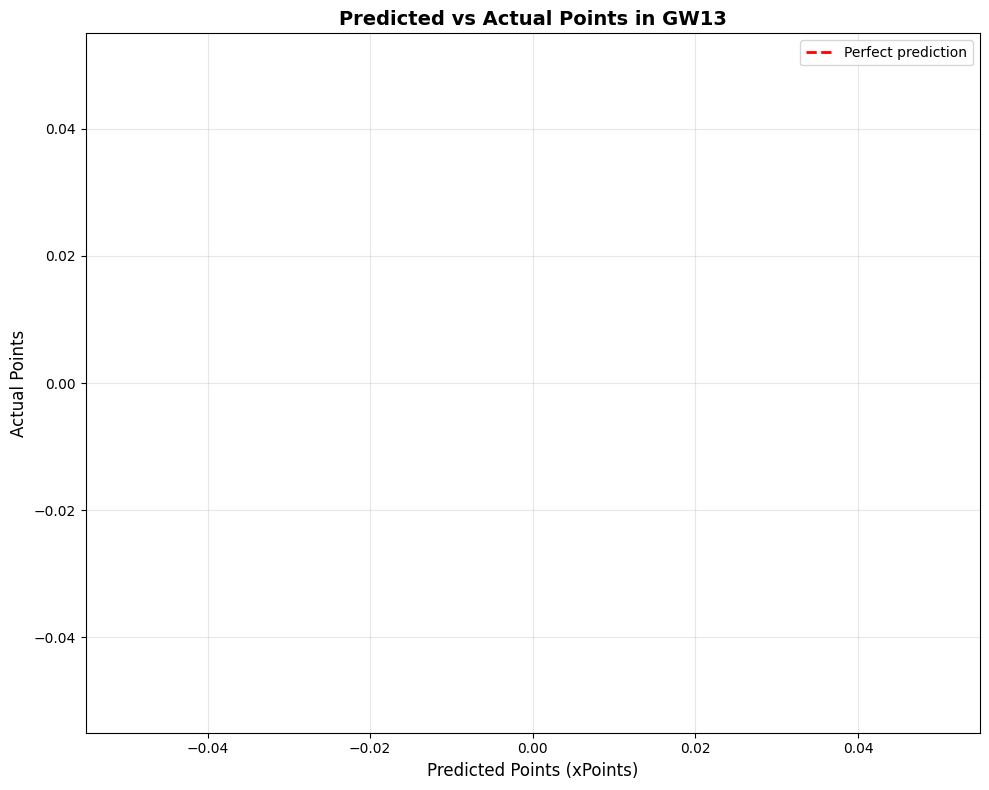

In [248]:
# Create the plot
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_complete, x='xpoints', y='total_points', alpha=0.6)

# Add a diagonal reference line (perfect predictions)
max_val = max(df_complete['xpoints'].max(), df_complete['total_points'].max())
plt.plot([0, max_val], [0, max_val], 'r--', label='Perfect prediction', linewidth=2)

print(f"Correlation: {df_complete['xpoints'].corr(df_complete['total_points']):.3f}")
print(f"Mean Absolute Error: {(df_complete['xpoints'] - df_complete['total_points']).abs().mean():.3f}")
print(f"Root Mean Squared Error: {((df_complete['xpoints'] - df_complete['total_points'])**2).mean()**0.5:.3f}")

plt.xlabel('Predicted Points (xPoints)', fontsize=12)
plt.ylabel('Actual Points', fontsize=12)
plt.title(f'Predicted vs Actual Points in GW{stats_current_gameweek}', fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
finish=time.perf_counter()
print(f'Finished in {round(((finish-start)/60),2)} minute(s)')
#10/11/25: Finished in 8.91 minute(s)

Finished in 8.91 minute(s)
